In [1]:
# Standard Library Imports
import os
import sys
from typing import List, Any, Callable, Union, Tuple, Optional
from importlib import reload

# Third-Party Library Imports
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import cartopy.crs as ccrs
from functools import partial
from glob import glob
import cftime
import string

# Custom Module Imports
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'zecmip_stabilisation_drafts'))
import constants
sys.path.append(constants.MODULE_DIR)
import open_zecmip
import utils
import signal_to_noise as sn
import plotting_functions
import xarray_extender as xe
import zec_calculation_functions
import drift_functions
import sn_plotting
import stats
import signal_to_noise_calculations as sn_calc

# Suppress Warnings
import warnings
warnings.filterwarnings('ignore')

# # Logging
# logger = utils.get_notebook_logger()

Matplotlib created a temporary config/cache directory at /jobfs/121987232.gadi-pbs/matplotlib-wm3ffizm because the default path (/home/563/ab2313/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Matplotlib is building the font cache; this may take a moment.


In [2]:
np.set_printoptions(precision=2, suppress=True, edgeitems=1)
xr.set_options(display_expand_data=False)

In [3]:
sys.path.append(os.path.join(os.getcwd(), 'Documents', 'list_xarray'))
from listXarray import listXarray

In [393]:
client.close()

- Closing Nanny at 'tcp://127.0.0.1:41425'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:45667'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:39811'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:41739'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:37311'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:36321'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:38355'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close


In [5]:
from dask.distributed import Client
client = Client()
client

- State start
-   Scheduler at:     tcp://127.0.0.1:46357
-   dashboard at:         /proxy/8787/status
- Registering Worker plugin shuffle
-         Start Nanny at: 'tcp://127.0.0.1:41425'
-         Start Nanny at: 'tcp://127.0.0.1:45667'
-         Start Nanny at: 'tcp://127.0.0.1:39811'
-         Start Nanny at: 'tcp://127.0.0.1:41739'
-         Start Nanny at: 'tcp://127.0.0.1:37311'
-         Start Nanny at: 'tcp://127.0.0.1:36321'
-         Start Nanny at: 'tcp://127.0.0.1:38355'
- Register worker <WorkerState 'tcp://127.0.0.1:34849', name: 5, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127.0.0.1:34849
- Starting established connection to tcp://127.0.0.1:53036
- Register worker <WorkerState 'tcp://127.0.0.1:37987', name: 6, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127.0.0.1:37987
- Starting established connection to tcp://127.0.0.1:53070
- Register worker <WorkerState 'tcp://127.0.0.1:35887', name: 3, status

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 7
Total threads: 28,Total memory: 251.18 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:46357,Workers: 7
Dashboard: /proxy/8787/status,Total threads: 28
Started: Just now,Total memory: 251.18 GiB
Comm: tcp://127.0.0.1:39509,Total threads: 4
Dashboard: /proxy/46753/status,Memory: 35.88 GiB
Nanny: tcp://127.0.0.1:41425,


- Event loop was unresponsive in Nanny for 3.31s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.23s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.24s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.24s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Scheduler for 3.24s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 3.24s.  This is often caused by long-r

# Opening Data

In [6]:
chunks = {'lat':-1, 'lon':-1, 'time':-1, 'ensemble':-1}

In [7]:
a1_raw_xrlist = open_zecmip.extract_experiment_into_xrlist('1000pgc', 'tas', chunks=chunks, logginglevel='ERROR'
                                                          ).to_dataarray('tas').sort_by_refkey()

In [8]:
pct_raw_xrlist = open_zecmip.extract_experiment_into_xrlist('1pct', 'tas', chunks=chunks).to_dataarray('tas').sort_by_refkey()

In [9]:
esmpi_raw_xrlist = (open_zecmip.extract_experiment_into_xrlist('picontrol', 'tas', chunks=chunks, logginglevel='INFO')
                    .to_dataarray('tas')
                    .isel(ensemble=0)
                    .squeeze('ensemble')
                    .sort_by_refkey()
                    .rename({'latitude':'lat', 'longitude': 'lon'}))

- ACCESS-ESM1-5
-      r1i1p1f1 - /g/data/fs38/publications/CMIP6/CMIP/CSIRO/ACCESS-ESM1-5/piControl/r1i1p1f1/Amon/tas/gn/v20210316/*.nc
- CanESM5
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p1f1/Amon/tas/gn/v20190429/*.nc
-      r1i1p2f1 - /g/data/oi10/replicas/CMIP6/CMIP/CCCma/CanESM5/piControl/r1i1p2f1/Amon/tas/gn/v20190429/*.nc
- MIROC-ES2L
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MIROC/MIROC-ES2L/piControl/r1i1p1f2/Amon/tas/gn/v20190823/*.nc
- UKESM1-0-LL
-      r1i1p1f2 - /g/data/oi10/replicas/CMIP6/CMIP/MOHC/UKESM1-0-LL/piControl/r1i1p1f2/Amon/tas/gn/v20200828/*.nc
- MPI-ESM1-2-LR
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/piControl/r1i1p1f1/Amon/tas/gn/v20190710/*.nc
-      r2i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/MPI-M/MPI-ESM1-2-LR/piControl/r2i1p1f1/Amon/tas/gn/v20190815/*.nc
- GISS-E2-1-G-CC
-      r1i1p1f1 - /g/data/oi10/replicas/CMIP6/CMIP/NASA-GISS/GISS-E2-1-G-CC/piControl/r1i1p1f1/Amon/tas/gn/v2

In [10]:
# Match all the ensemble dimensions
pct_raw_xrlist = pct_raw_xrlist.cross_match_dim(a1_raw_xrlist, 'ensemble')
a1_raw_xrlist = a1_raw_xrlist.cross_match_dim(pct_raw_xrlist, 'ensemble')

In [11]:
# Only selecting one ensemble member for each model
a1_raw_xrlist = a1_raw_xrlist.isel(ensemble=0).chunk('auto')
pct_raw_xrlist = pct_raw_xrlist.isel(ensemble=0).chunk('auto')
esmpi_raw_xrlist = esmpi_raw_xrlist.isel(ensemble=0).chunk('auto')

In [12]:
# After the year 1000 all values appear to be 0
#esmpi_raw_xrlist['CanESM5'] = esmpi_raw_xrlist['CanESM5'].isel(time=slice(None,1000))

In [13]:
esmpi_raw_xrlist['CanESM5']

<xarray.DataArray 'tas' (model: 1, time: 16800, lat: 64, lon: 128)> Size: 551MB
dask.array<chunksize=(1, 2400, 64, 128), meta=np.ndarray>
Coordinates:
  * time      (time) object 134kB 5201-01-16 12:00:00 ... 6600-12-16 12:00:00
  * lat       (lat) float64 512B -87.86 -85.1 -82.31 -79.53 ... 82.31 85.1 87.86
  * lon       (lon) float64 1kB 0.0 2.812 5.625 8.438 ... 351.6 354.4 357.2
  * model     (model) <U7 28B 'CanESM5'
    ensemble  <U8 32B 'r1i1p1f1'
Attributes:
    standard_name:  air_temperature
    long_name:      Near-Surface Air Temperature
    comment:        ST+273.16, CMIP_table_comment: near-surface (usually, 2 m...
    units:          K
    original_name:  ST
    history:        degctok 2019-04-30T17:18:16Z altered by CMOR: Treated sca...
    cell_methods:   area: time: mean
    cell_measures:  area: areacella

# Global Mean Calculation

In [14]:
# Convert to celcius
a1_raw_xrlist = a1_raw_xrlist - 273.15
pct_raw_xrlist = pct_raw_xrlist - 273.15
esmpi_raw_xrlist = esmpi_raw_xrlist - 273.15

In [15]:
esmpi_regrid_xrlist = esmpi_raw_xrlist.chunk('auto').regrid('MPI-ESM1-2-LR', 'bilinear').set_refkeys('model')
pct_regrid_xrlist = pct_raw_xrlist.chunk('auto').regrid('MPI-ESM1-2-LR', 'bilinear').set_refkeys('model')
a1_regrid_xrlist = a1_raw_xrlist.chunk('auto').regrid('MPI-ESM1-2-LR', 'bilinear').set_refkeys('model')

In [16]:
# Making the data yearly
esmpi_xrlist = esmpi_regrid_xrlist.resample(time='Y').mean(dim='time').set_refkeys('model').chunk('auto')
pct_xrlist = pct_regrid_xrlist.resample(time='Y').mean(dim='time').set_refkeys('model').chunk('auto')
a1_xrlist = a1_regrid_xrlist.resample(time='Y').mean(dim='time').set_refkeys('model').chunk('auto')

In [17]:
a1_xrlist

key_dim = model


Number of da/ds: 9
---------------
MPI-ESM1-2-LR ({'model': 1, 'time': 185, 'lat': 96, 'lon': 192})
ACCESS-ESM1-5 ({'model': 1, 'time': 101, 'lat': 96, 'lon': 192})
CESM2         ({'model': 1, 'time': 150, 'lat': 96, 'lon': 192})
CanESM5       ({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})
GFDL-ESM4     ({'model': 1, 'time': 200, 'lat': 96, 'lon': 192})
GISS-E2-1-G-CC({'model': 1, 'time': 180, 'lat': 96, 'lon': 192})
MIROC-ES2L    ({'model': 1, 'time': 248, 'lat': 96, 'lon': 192})
NorESM2-LM    ({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})
UKESM1-0-LL   ({'model': 1, 'time': 330, 'lat': 96, 'lon': 192})

In [18]:
# Subsetting to only first 150 years so all models have equal footing

# Reduce time so that the smalles time densions matches. This is at 101 years
a1_xrlist = a1_xrlist.isel(time=slice(None, 100))
a1_xrlist

key_dim = model


Number of da/ds: 9
---------------
MPI-ESM1-2-LR ({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})
ACCESS-ESM1-5 ({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})
CESM2         ({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})
CanESM5       ({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})
GFDL-ESM4     ({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})
GISS-E2-1-G-CC({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})
MIROC-ES2L    ({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})
NorESM2-LM    ({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})
UKESM1-0-LL   ({'model': 1, 'time': 100, 'lat': 96, 'lon': 192})

In [19]:
# The global weighted mean
pct_smean_xrlist = pct_xrlist.chunk('auto').apply(sn.calculate_global_value, 'tas')
a1_smean_xrlist = a1_xrlist.chunk('auto').apply(sn.calculate_global_value, 'tas')
esmpi_smean_xrlist = esmpi_xrlist.apply(sn.calculate_global_value, 'tas')

In [20]:
esmpi_smean_xrlist = esmpi_smean_xrlist.compute()
a1_smean_xrlist = a1_smean_xrlist.compute()
pct_smean_xrlist = pct_smean_xrlist.compute()

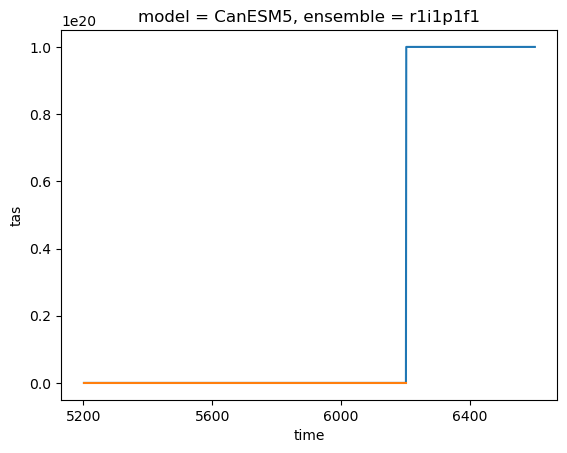

In [21]:
esmpi_smean_xrlist['CanESM5'].plot()
esmpi_smean_xrlist['CanESM5'].isel(time=slice(None, 1000)).plot()

In [22]:
esmpi_smean_xrlist['CanESM5'] = esmpi_smean_xrlist['CanESM5'].isel(time=slice(None, 1000))

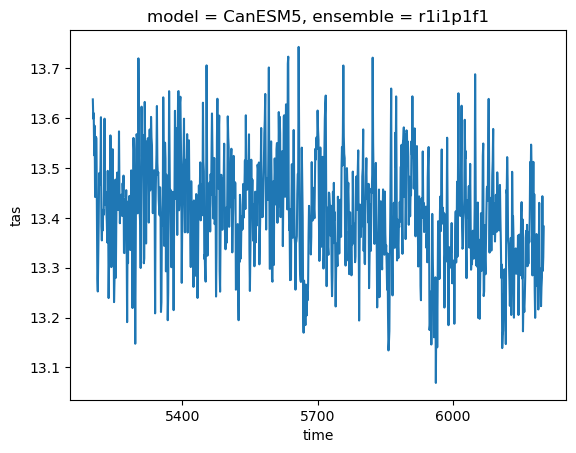

In [23]:
esmpi_smean_xrlist['CanESM5'].plot()

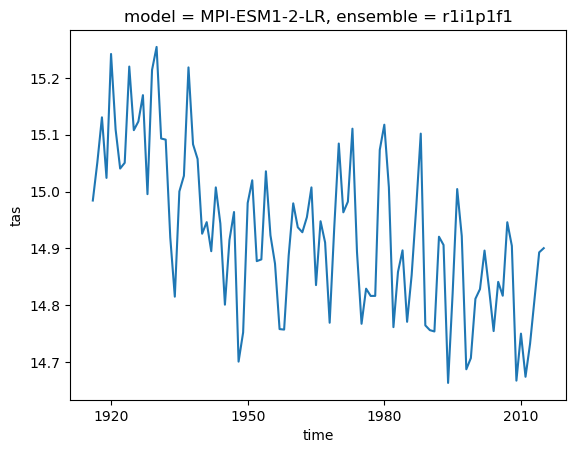

In [24]:
a1_smean_xrlist[0].plot()

In [25]:
# Calculate the values at the branching point
branch_point_mean_xrlist = listXarray([zec_calculation_functions.calculate_branch_average(
    pct_smean_xrlist[model], a1_smean_xrlist[model], logginglevel='INFO') for model in pct_smean_xrlist.refkeys]).set_refkeys('model')

- ['MPI-ESM1-2-LR'] - ['MPI-ESM1-2-LR']
- branch_start_time=cftime.DatetimeProlepticGregorian(1915, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=65
- 

- ['ACCESS-ESM1-5'] - ['ACCESS-ESM1-5']
- branch_start_time=cftime.DatetimeProlepticGregorian(168, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=67
- 

- ['CESM2'] - ['CESM2']
- branch_start_time=cftime.DatetimeNoLeap(68, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=67
- 

- ['CanESM5'] - ['CanESM5']
- branch_start_time=cftime.DatetimeNoLeap(1911, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=61
- 

- ['GFDL-ESM4'] - ['GFDL-ESM4']
- branch_start_time=cftime.DatetimeNoLeap(64, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=63
- 

- ['GISS-E2-1-G-CC'] - ['GISS-E2-1-G-CC']
- branch_start_time=cftime.DatetimeNoLeap(1920, 12, 31, 0, 0, 0, 0, has_year_zero=True)
- onepct_branch_arg=70
- 

- ['MIROC-ES2L'] - ['MIROC-ES2L']
- branch_start_time=cftime.DatetimeGregorian(1913, 

In [26]:
# The amomaly time series from the branch point
a1_smean_anom_xrlist = (a1_smean_xrlist - branch_point_mean_xrlist).compute()

In [27]:
a1_smean_xrlist

key_dim = model


Number of da/ds: 9
---------------
MPI-ESM1-2-LR ({'model': 1, 'time': 100})
ACCESS-ESM1-5 ({'model': 1, 'time': 100})
CESM2         ({'model': 1, 'time': 100})
CanESM5       ({'model': 1, 'time': 100})
GFDL-ESM4     ({'model': 1, 'time': 100})
GISS-E2-1-G-CC({'model': 1, 'time': 100})
MIROC-ES2L    ({'model': 1, 'time': 100})
NorESM2-LM    ({'model': 1, 'time': 100})
UKESM1-0-LL   ({'model': 1, 'time': 100})

In [28]:
# All modles now have matching coordinates - can now be converted to xarray
# previosly a1 was a1_smean_anom_xrlist
a1_smean_anom_ds = a1_smean_anom_xrlist.copy(deep=True).apply(utils.reset_time_to_0_start).concat('model')
a1_smean_ds = a1_smean_xrlist.copy(deep=True).apply(utils.reset_time_to_0_start).concat('model')
pct_smean_ds = pct_smean_xrlist.copy(deep=True).apply(utils.reset_time_to_0_start).concat('model')
esmpi_smean_ds = esmpi_smean_xrlist.copy(deep=True).apply(utils.reset_time_to_0_start).concat('model')

In [29]:
# This way procudes the same as when you average first then take the anomalies. However, we also get the anomaleis
# time series which is useful
zec25_ds = a1_smean_anom_ds.isel(time=slice(15, 35)).mean(dim='time')
zec50_ds = a1_smean_anom_ds.isel(time=slice(40, 60)).mean(dim='time')
zec50_ds

<xarray.DataArray 'tas' (model: 9)> Size: 72B
-0.2702 0.0113 -0.3096 -0.1017 -0.2054 -0.09008 -0.1086 -0.3344 0.2894
Coordinates:
  * model     (model) <U14 504B 'MPI-ESM1-2-LR' ... 'UKESM1-0-LL'
    ensemble  (model) <U8 288B 'r1i1p1f1' 'r1i1p1f1' ... 'r1i1p1f1' 'r1i1p1f2'

In [30]:
zec50_ds.to_pandas().sort_index().round(2)

model
ACCESS-ESM1-5     0.01
CESM2            -0.31
CanESM5          -0.10
GFDL-ESM4        -0.21
GISS-E2-1-G-CC   -0.09
MIROC-ES2L       -0.11
MPI-ESM1-2-LR    -0.27
NorESM2-LM       -0.33
UKESM1-0-LL       0.29
dtype: float64

In [31]:
a1_smean_anom_ds = a1_smean_anom_ds.dropna(dim='time')

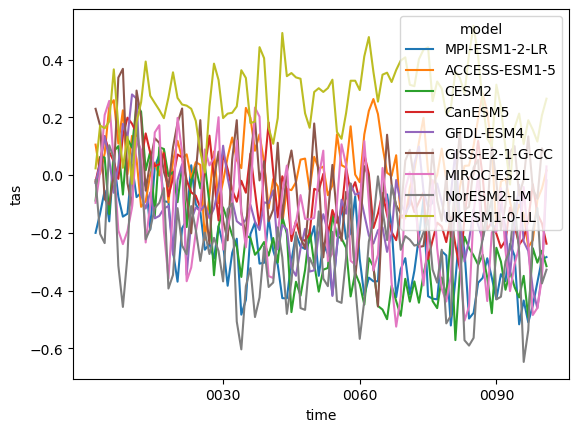

In [32]:
a1_smean_anom_ds.plot(hue='model');

# SN Calculation

In [33]:
# Detrend the data
a1_smean_anom_trendfit_ds = stats.trend_fit(a1_smean_anom_ds, method='polynomial', order=4)
a1_smean_anom_detrend_ds = a1_smean_anom_ds - a1_smean_anom_trendfit_ds

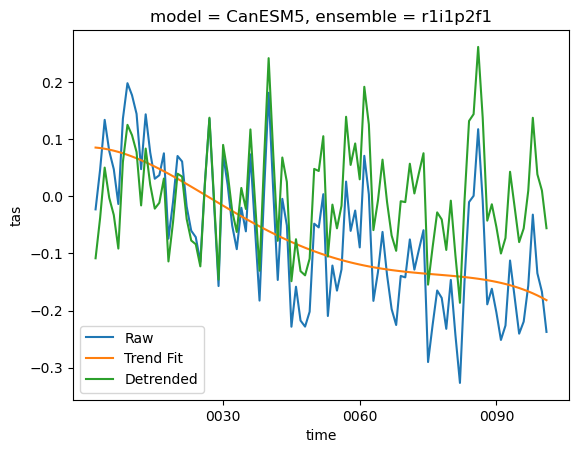

In [34]:
model = 'CanESM5'#'CESM2'
a1_smean_anom_ds.sel(model=model).plot(label='Raw')
a1_smean_anom_trendfit_ds.sel(model=model).plot(label='Trend Fit')
a1_smean_anom_detrend_ds.sel(model=model).plot(label='Detrended')
plt.legend()

In [35]:
# Params to use for both
SN_PARAMS = dict(return_all=True, center=True, return_control=True, logginglevel='ERROR')

In [36]:
# This is the length that all of the plots shoudl go to
# The end window is from the np.arange, and so goes to one before (so subtract one).
max_effective_length = len(a1_smean_anom_ds.time.values) - (constants.ZECMIP_MULTI_WINDOW_RUN_PARAMS['end_window']-1)
max_effective_length

60

In [37]:
# Static
sn_multi_static_ds, sn_multi_static_control_ds = sn.multiwindow_signal_to_nosie_and_bounds(
    a1_smean_anom_ds, esmpi_smean_ds, da_for_noise = a1_smean_anom_detrend_ds,
    rolling_noise=False, lower_bound=5, upper_bound=95,  **SN_PARAMS, **constants.ZECMIP_MULTI_WINDOW_RUN_PARAMS)#.compute()

sn_multi_static_ds = sn_multi_static_ds.isel(time=slice(None, max_effective_length)).compute()


Experiment
--------

Concatenating objects - PLEASE be patient!
 - Finished

Control
------


Concatenating objects - PLEASE be patient!
Persist
Calculating bounds
final merge


In [38]:
%%time

# Rolling
sn_multi_rolling_ds, sn_multi_rolling_control_ds = sn.multiwindow_signal_to_nosie_and_bounds(
    a1_smean_anom_ds, esmpi_smean_ds, da_for_noise = a1_smean_anom_detrend_ds,
    rolling_noise=True, lower_bound=5, upper_bound=95,  **SN_PARAMS, **constants.ZECMIP_MULTI_WINDOW_RUN_PARAMS)
# Slicing to the max effective length
sn_multi_rolling_ds = sn_multi_rolling_ds.isel(time=slice(None, max_effective_length)).compute()


Experiment
--------
10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 
Concatenating objects - PLEASE be patient!
 - Finished

Control
------

10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 
Concatenating objects - PLEASE be patient!
Persist
Calculating bounds
final merge
CPU times: user 3.6 s, sys: 242 ms, total: 3.84 s
Wall time: 3.58 s


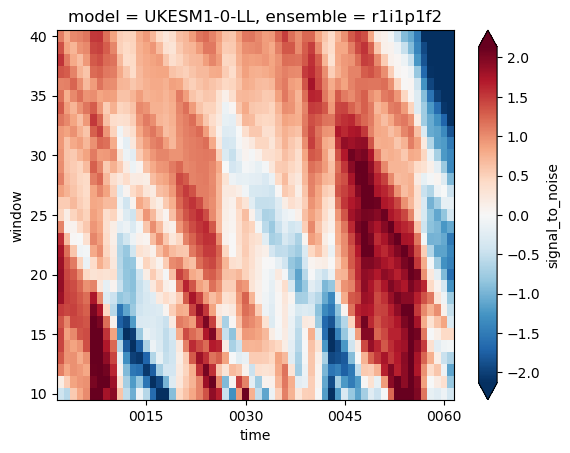

In [39]:
sn_multi_rolling_ds.sel(model='UKESM1-0-LL').signal_to_noise.plot(robust=True)

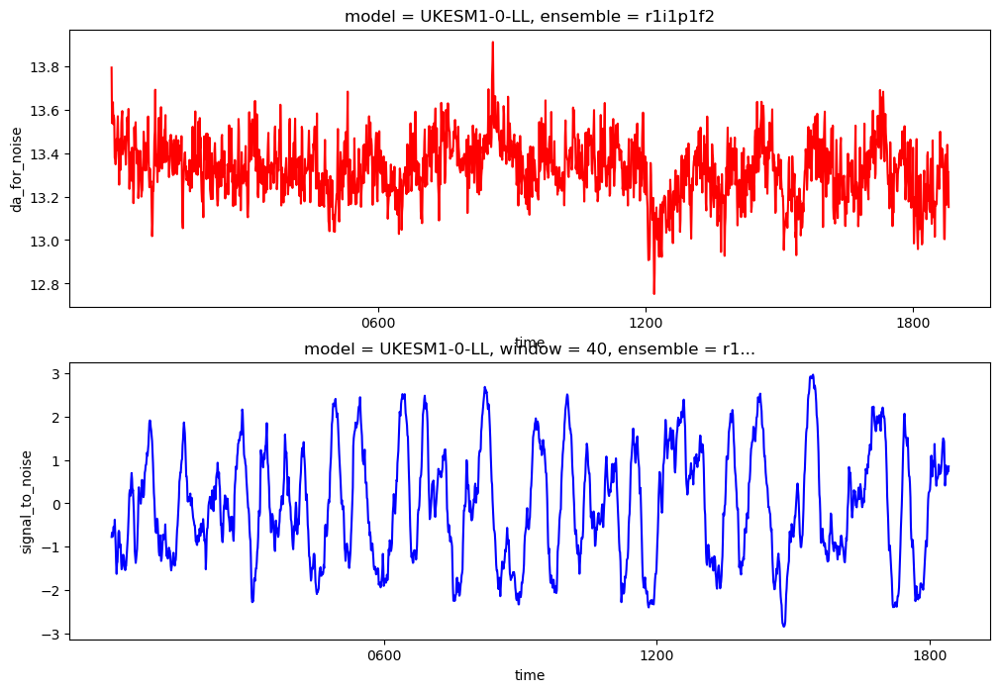

In [40]:
fig, (ax, ax2) = plt.subplots(2, 1,figsize=(12, 8))
# ax2 = ax.twinx()
esmpi_smean_ds.sel(model='UKESM1-0-LL').plot(ax=ax, color='red')
sn_multi_rolling_control_ds.signal_to_noise.sel(model='UKESM1-0-LL', window=40).plot(ax=ax2, color='blue')

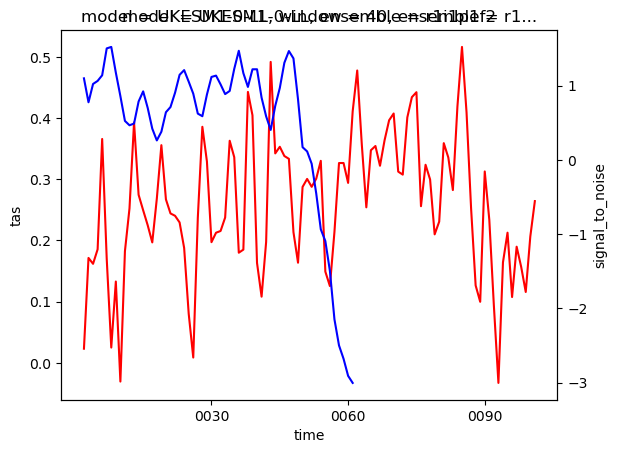

In [41]:
fig, ax = plt.subplots()
ax2 = ax.twinx()
a1_smean_anom_ds.sel(model='UKESM1-0-LL').plot(ax=ax, color='red')
sn_multi_rolling_ds.signal_to_noise.sel(model='UKESM1-0-LL', window=40).plot(ax=ax2, color='blue')

In [42]:
# Calculate the year that each is stable
# I want both a dataset version (all ensembles) and a da version (ensemble mean but easier to use)

# Rolling
# rolling_year_stable_ds = sn.get_stable_year_ds(sn_multi_rolling_ds, max_effective_length=max_effective_length)

# Static
# static_year_stable_ds = sn.get_stable_year_ds(sn_multi_static_ds, max_effective_length=max_effective_length)

# static_year_stable_ds

In [43]:
# # Number of models stable at each time step.
rolling_stability_levels_ds = sn.stability_levels(sn_multi_rolling_ds)
static_stability_levels_ds = sn.stability_levels(sn_multi_static_ds)

In [44]:
# Just the unstalgbe points - both xrlist and ds
above_or_below_kwargs = dict(main_var='signal_to_noise', greater_than_var='upper_bound', less_than_var='lower_bound')

unstable_rolling_ds = sn_multi_rolling_ds.utils.above_or_below(**above_or_below_kwargs)
unstable_static_ds = sn_multi_static_ds.utils.above_or_below(**above_or_below_kwargs)

In [45]:
# For each window get the number of years that are stable forn each point in time
decreasing_ds = xr.where(unstable_rolling_ds < 0, 1, 0)
increasing_ds = xr.where(unstable_rolling_ds > 0, 1, 0)

In [46]:
ufunc_year_stabilisation_kwargs = dict(
    input_core_dims=[['time'], []],
    output_core_dims=[[]],
    vectorize=True,
    output_dtypes=[np.float]
)

In [47]:
# Get the year that stabilisation occurs

static_year_stable_ds = xr.apply_ufunc(
    sn_calc.get_year_stable_v2,
    unstable_static_ds.signal_to_noise.squeeze(),
    unstable_static_ds.window,
    **ufunc_year_stabilisation_kwargs, 
)

In [48]:
# Get the year that stabilisation occurs
rolling_year_stable_old_version_ds = xr.apply_ufunc(
    sn_calc.get_year_stable_v2, # sn_calc.get_year_stable
    unstable_rolling_ds.signal_to_noise.squeeze(),
    unstable_rolling_ds.window,
    **ufunc_year_stabilisation_kwargs
)

In [49]:
# rolling_year_stable_ds = rolling_year_stable_ds.to_dataset(name='time')

# New Methods

In [52]:
sn_multi_rolling_ds

<xarray.Dataset> Size: 542kB
Dimensions:          (window: 31, model: 9, time: 60)
Coordinates:
  * model            (model) <U14 504B 'MPI-ESM1-2-LR' ... 'UKESM1-0-LL'
  * time             (time) object 480B 0001-12-31 00:00:00 ... 0060-12-31 00...
  * window           (window) int64 248B 10 11 12 13 14 15 ... 35 36 37 38 39 40
    ensemble         (model) <U8 288B 'r1i1p1f1' 'r1i1p1f1' ... 'r1i1p1f2'
Data variables:
    signal           (window, model, time) float64 134kB 0.1093 ... -0.2768
    da_for_noise     (window, model, time) float64 134kB -0.1567 ... 0.0896
    noise            (window, model, time) float64 134kB 0.08977 ... 0.0922
    signal_to_noise  (window, model, time) float64 134kB 1.218 0.6431 ... -3.002
    lower_bound      (window, model) float64 2kB -2.523 -2.661 ... -1.639 -2.033
    upper_bound      (window, model) float64 2kB 2.641 2.559 ... 1.555 2.127

In [ ]:
unstable_rolling_ds.isel(model=imodel).sel(window=30).signal_to_noise.values

In [107]:
window = 30
imodel = 3

In [114]:
arr = unstable_rolling_ds.isel(model=imodel).signal_to_noise.sel(window=window).values
# arr = arr[:window]

In [115]:
arr

array([  nan, -2.18, -2.49, -2.37, -2.47, -2.19, -2.58, -2.69, -2.28,
         nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,
       -1.93,   nan,   nan,   nan,   nan,   nan, -1.99, -1.93,   nan,
         nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,
         nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,
         nan,   nan,   nan,   nan,   nan,   nan,   nan, -2.1 ,   nan,
         nan,   nan,   nan,   nan,   nan,   nan])

In [116]:
finite_arr = np.isfinite(arr)
finite_arr

array([False,  True,  True,  True,  True,  True,  True,  True,  True,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False,  True,  True, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False,  True, False,
       False, False, False, False, False, False])

In [111]:
np.argwhere(finite_arr==1)[-1][-1]

25

In [112]:
np.sum(finite_arr)/window

0.36666666666666664

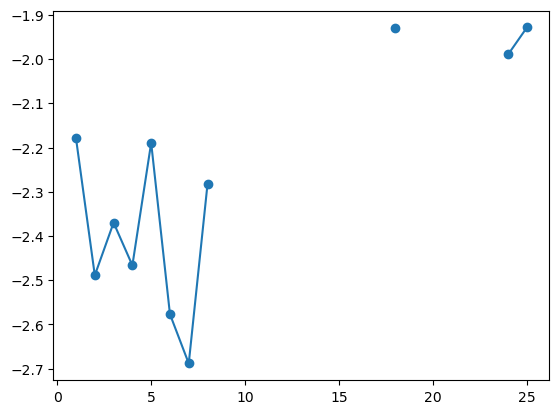

In [113]:
plt.plot(arr, marker='o')

In [59]:
np.sum(finite_arr)

6

In [117]:
def get_stable_arg(arr, window, fraction=0.3):
    finite_arr = np.isfinite(arr)
    
    for sel_start in range(len(finite_arr)-int(window/2)):
        finite_arr_selection = finite_arr[sel_start:sel_start+int(window/2)]
        number_stable = np.sum(finite_arr_selection)
        fraction_unstable = number_stable/window
        # THe number of stable points is less than 0.4 => stability achieved
        if fraction_unstable < fraction:
            # Figure out where the first stable value occurs
            series_remainder = finite_arr[sel_start:]
            if series_remainder[0] == 0:
                reminder = 0
            else:
                reminder = np.argwhere(series_remainder==0)[0][0]
                
            return sel_start + reminder+1

    # Stability never achieved return arg + the offset
    return sel_start + int(window/2)


In [177]:
# Get the year that stabilisation occurs
rolling_year_stable_ds_v1 = xr.apply_ufunc(
    get_stable_arg, # sn_calc.get_year_stable
    unstable_rolling_ds.signal_to_noise.squeeze(),
    unstable_rolling_ds.window,
    **ufunc_year_stabilisation_kwargs
)

In [245]:
from itertools import takewhile
from typing import List

def count_consecutive_ones(arr: List[int]) -> int:
    """
    Counts the number of consecutive 1s at the start of the array.

    Parameters:
    arr (List[int]): The input list containing 1s and 0s.

    Returns:
    int: The count of consecutive 1s at the beginning of the array.
    """
    # Use takewhile to generate an iterator that stops when the first 0 is encountered
    consecutive_ones = takewhile(lambda x: x == 1, arr)
    
    # Count the elements returned by takewhile
    count = sum(1 for _ in consecutive_ones)
    
    return count

In [327]:
def get_stable_arg_v2(arr: np.ndarray, window: int, fraction: float = 0.6) -> int:
    """
    Finds the index where stability is achieved in the array based on a given window and fraction.

    Parameters:
    arr (np.ndarray): The input array to analyze.
    window (int): The size of the window to consider for stability.
    fraction (float): The fraction threshold to determine stability. Default is 0.5.

    Returns:
    int: The index where stability is achieved.
    """
    finite_arr = np.isfinite(arr)
    
    for sel_start in range(len(finite_arr)-int(window/2)):
        # Make sub-selection
        finite_arr_selection = finite_arr[sel_start:sel_start+int(window/2)]
        # Number that are unstable (unstable =1, stable = 0)
        number_unstable = np.sum(finite_arr_selection)
        # Fraction that is unstalbe
        fraction_unstable = number_unstable/int(window/2)
        
        # If < 0.2 is unstalbe, then call stability immediately. Do not add consecs     
        if fraction_unstable < 0.33:
            return sel_start

        # If the fraction is less than fraciton - stability is achieved
        if fraction_unstable < fraction:
            # Figure out where the last unstable value occurs in selection
            last_arg = np.argwhere(finite_arr_selection==1)
            last_arg = last_arg[-1][-1] if len(last_arg) > 0 else 0
            last_arg = last_arg+1 # Always one behind, so add 1
            stable_year = sel_start + last_arg
            
            # The next element is one after the stable year - so why should it be stable there?
            if finite_arr[stable_year+1] == 1: 
                cosec_after_stabilisation = count_consecutive_ones(finite_arr[stable_year+1:])
                stable_year = stable_year + cosec_after_stabilisation+1
            return stable_year

    # Stability never achieved return arg + the offset
    return sel_start + int(window/2)


In [328]:
# Get the year that stabilisation occurs
rolling_year_stable_ds_v2 = xr.apply_ufunc(
    get_stable_arg_v2, # sn_calc.get_year_stable
    unstable_rolling_ds.signal_to_noise.squeeze(),
    unstable_rolling_ds.window,
    **ufunc_year_stabilisation_kwargs
)

# Veryfying things work

In [329]:
rolling_year_stable_ds_v2.isel(model=imodel).sel(window=31).values

array(19.)

In [330]:
unstable_rolling_ds.isel(model=imodel).sel(window=31).signal_to_noise.values

array([  nan,   nan, -1.67, -1.96, -1.75, -1.72, -2.09, -2.6 , -2.92,
       -2.75, -2.21, -1.85, -2.05, -2.03, -1.61, -1.55,   nan, -1.55,
       -1.66,   nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,
         nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,
         nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,
         nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,   nan,
         nan,   nan,   nan,   nan,   nan,   nan])

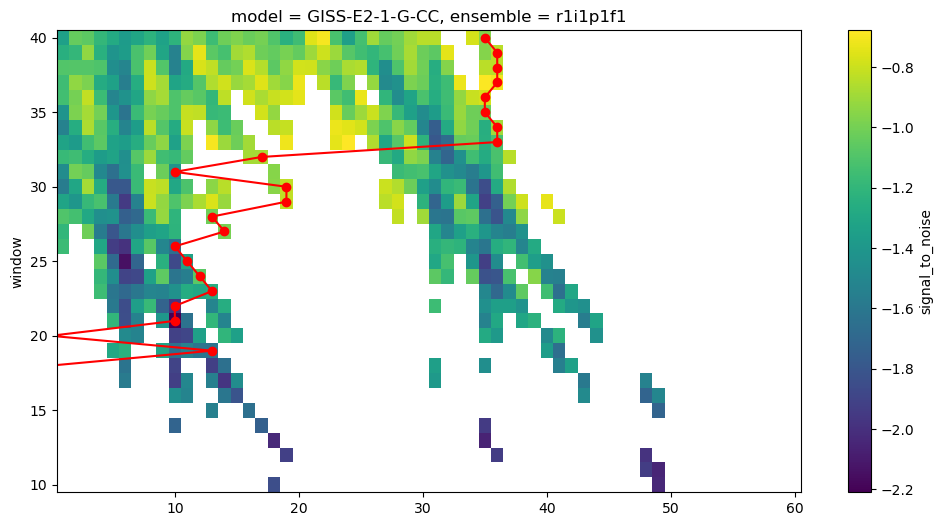

In [392]:
fig = plt.figure(figsize=(12, 6))
imodel=5
unstable_rolling_ds.isel(model=imodel).signal_to_noise.plot(y='window')
rolling_year_stable_ds_v2.isel(model=imodel).plot(y='window', marker='o', color='red')

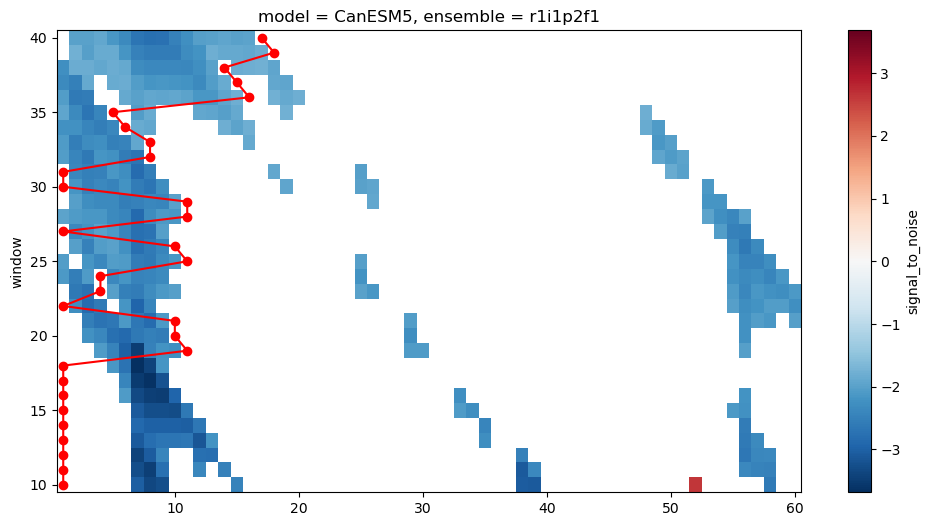

In [340]:
fig = plt.figure(figsize=(12, 6))
imodel=3
unstable_rolling_ds.isel(model=imodel).signal_to_noise.plot(y='window')
rolling_year_stable_ds_v1.isel(model=imodel).plot(y='window', marker='o', color='red')

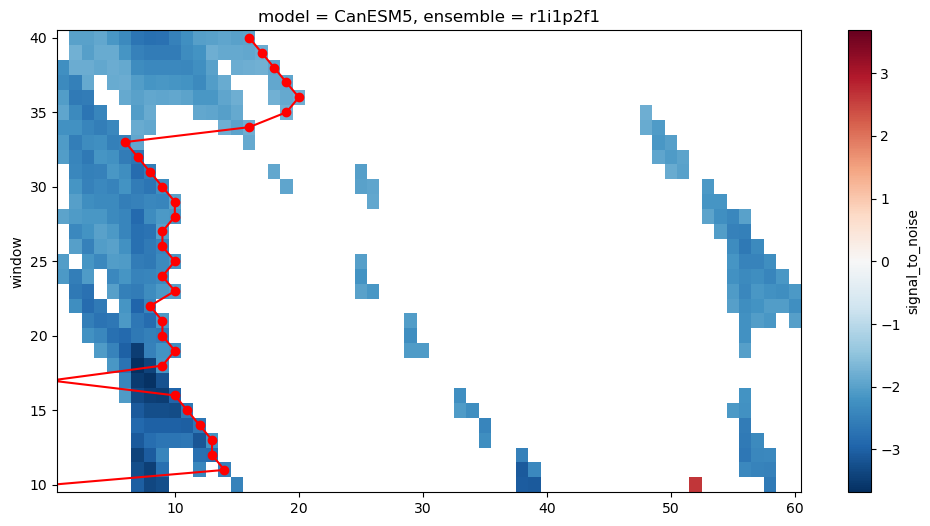

In [341]:
fig = plt.figure(figsize=(12, 6))
unstable_rolling_ds.sel(model='CanESM5').signal_to_noise.plot(y='window')
rolling_year_stable_old_version_ds.sel(model='CanESM5').plot(y='window', marker='o', color='red')

# Exact Year Stable

In [342]:
rolling_year_stable_ds = rolling_year_stable_ds_v2

In [343]:
exact_year_stable = rolling_year_stable_ds.max(dim='window')
exact_year_stable#.plot()

<xarray.DataArray (model: 9)> Size: 72B
21.0 5.0 41.0 20.0 9.0 36.0 0.0 19.0 0.0
Coordinates:
  * model     (model) <U14 504B 'MPI-ESM1-2-LR' ... 'UKESM1-0-LL'
    ensemble  (model) <U8 288B 'r1i1p1f1' 'r1i1p1f1' ... 'r1i1p1f1' 'r1i1p1f2'

In [344]:
year_of_stabilisation_dict = {}
for model in exact_year_stable.model.values:
    year = exact_year_stable.sel(model=model).values.item()
    window_ds = rolling_year_stable_ds.sel(model=model)
    window_val = window_ds.where(window_ds==year, drop=True).window.values[0]
    avtemp_at_stabilisation = a1_smean_anom_ds.sel(model=model).isel(time=slice(int(year), int(year)+20)).mean(dim='time').values.round(2).item()
    temp_at_stabilisation = a1_smean_anom_ds.sel(model=model).isel(time=int(year)).values.item()
    year_of_stabilisation_dict[model] = {'year':year, 'window': window_val, 'temp':temp_at_stabilisation, 'av_temp':avtemp_at_stabilisation}

In [345]:
year_of_stabilisation_df = pd.DataFrame(year_of_stabilisation_dict).transpose()

In [346]:
year_of_stabilisation_df.sort_index()

,year,window,temp,av_temp
ACCESS-ESM1-5,5.0,10.0,0.108739,0.03
CESM2,41.0,38.0,-0.143812,-0.31
CanESM5,20.0,36.0,-0.017555,-0.02
GFDL-ESM4,9.0,14.0,0.264656,-0.09
GISS-E2-1-G-CC,36.0,33.0,-0.018558,-0.07
MIROC-ES2L,0.0,10.0,-0.096023,-0.03
MPI-ESM1-2-LR,21.0,24.0,0.033933,-0.24
NorESM2-LM,19.0,29.0,-0.244266,-0.30
UKESM1-0-LL,0.0,10.0,0.023185,0.21


In [347]:
print(year_of_stabilisation_df[['year', 'av_temp']])

                year  av_temp
MPI-ESM1-2-LR   21.0    -0.24
ACCESS-ESM1-5    5.0     0.03
CESM2           41.0    -0.31
CanESM5         20.0    -0.02
GFDL-ESM4        9.0    -0.09
GISS-E2-1-G-CC  36.0    -0.07
MIROC-ES2L       0.0    -0.03
NorESM2-LM      19.0    -0.30
UKESM1-0-LL      0.0     0.21


In [348]:
print(year_of_stabilisation_df[['year', 'av_temp']])

                year  av_temp
MPI-ESM1-2-LR   21.0    -0.24
ACCESS-ESM1-5    5.0     0.03
CESM2           41.0    -0.31
CanESM5         20.0    -0.02
GFDL-ESM4        9.0    -0.09
GISS-E2-1-G-CC  36.0    -0.07
MIROC-ES2L       0.0    -0.03
NorESM2-LM      19.0    -0.30
UKESM1-0-LL      0.0     0.21


In [349]:
cooling_models = ['MPI-ESM1-2-LR', 'CESM2', 'CanESM5', 'GFDL-ESM4', 'GISS-E2-1-G-CC', 'NorESM2-LM']

In [350]:
year_of_stabilisation_df.loc[cooling_models].mean(axis=0)

year       24.333333
window     29.000000
temp       -0.020934
av_temp    -0.171667
dtype: float64

In [351]:
year_of_stabilisation_df.mean(axis=0)

year       16.777778
window     22.666667
temp       -0.009967
av_temp    -0.091111
dtype: float64

In [352]:
unstable_rolling_ds['time'] = unstable_rolling_ds.time.dt.year.values

AttributeError: 'DataArray' object has no attribute 'dt'

# Plots

In [353]:
def format_null_axis(ax):
    '''
    Axis that doesn't have any spines, or y tick labels or locaionts
    '''
    [ax.spines[sp].set_visible(False) for sp in ['top', 'left', 'right']]
    ax.set_yticks([])
    ax.set_yticklabels([])
    ax.set_title('')
    ax.set_ylabel('')

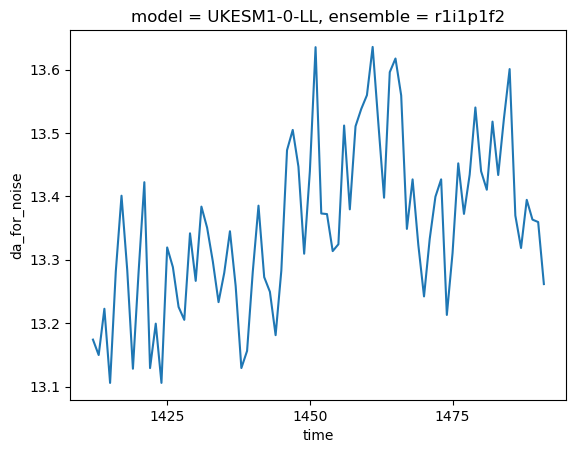

In [354]:
esmpi_smean_ds.sel(model='UKESM1-0-LL').isel(time=slice(1410, 1490)).plot()

In [355]:
esmpi_smean_ds.time.values

array([cftime.datetime(1, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False),
       ...,
       cftime.datetime(1880, 12, 31, 0, 0, 0, 0, calendar='standard', has_year_zero=False)],
      dtype=object)

In [356]:
vals = a1_smean_anom_ds.sel(model='UKESM1-0-LL').values

In [357]:
grad = np.polyfit(np.arange(len(vals)), vals, 1)[1]
grad

0.22823078707148894

In [358]:
grad  * len(vals)

22.823078707148895

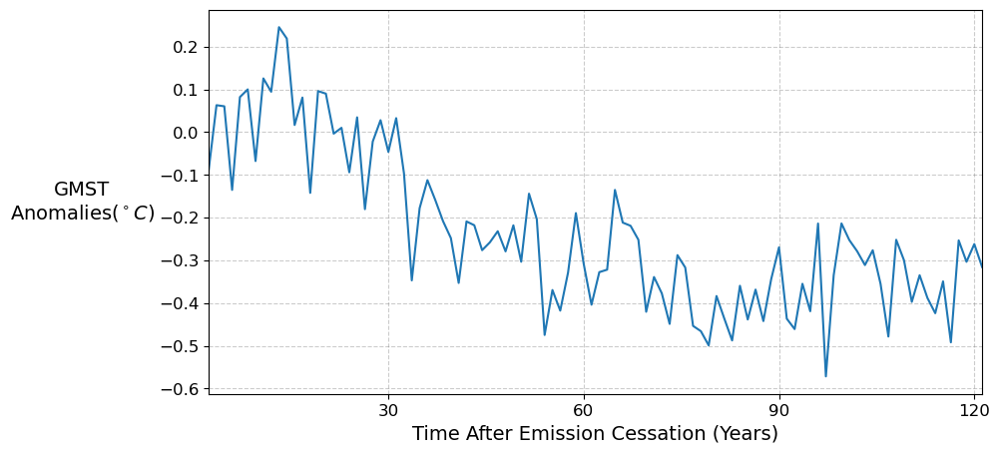

In [359]:
fig,ax1 = plt.subplots(1, 1,figsize=(10, 5))
# ax2 = ax.twinx()
ax1.plot(a1_smean_anom_ds.time.values, a1_smean_anom_ds.sel(model='CESM2').values)


# for window in [20, 40]:#np.arange(20, 41):
#     vals = a1_smean_anom_ds.sel(model='CESM2').isel(time=slice(0, window)).values
#     x = np.arange(len(vals))

#     grad_int = np.polyfit(x, vals, deg=1)
#     fitted_line = np.polyval(grad_int, x)
#     ax1.plot(a1_smean_anom_ds.time.values[:window], fitted_line, color='k', linewidth=2)


ax1.set_ylabel('GMST\nAnomalies' + r'($^\circ C$)', fontsize=14, rotation=0, labelpad=55, va='center', ha='center')

ax1.set_xticklabels([int(t.get_text()) for t in ax1.get_xticklabels()[1:]], size=12)
ax1.tick_params(axis='y', labelsize=12)
# sn_plotting.format_ticks_as_years(ax2, esmpi_smean_ds.sel(model='UKESM1-0-LL').isel(time=slice(650, 780)).time)
ax1.set_xlim(np.take(a1_smean_anom_ds.time.values, [0,-1]))
ax1.set_xlabel('Time After Emission Cessation (Years)', fontsize=14)
ax1.grid(True, linestyle='--', alpha=0.4, color='grey')

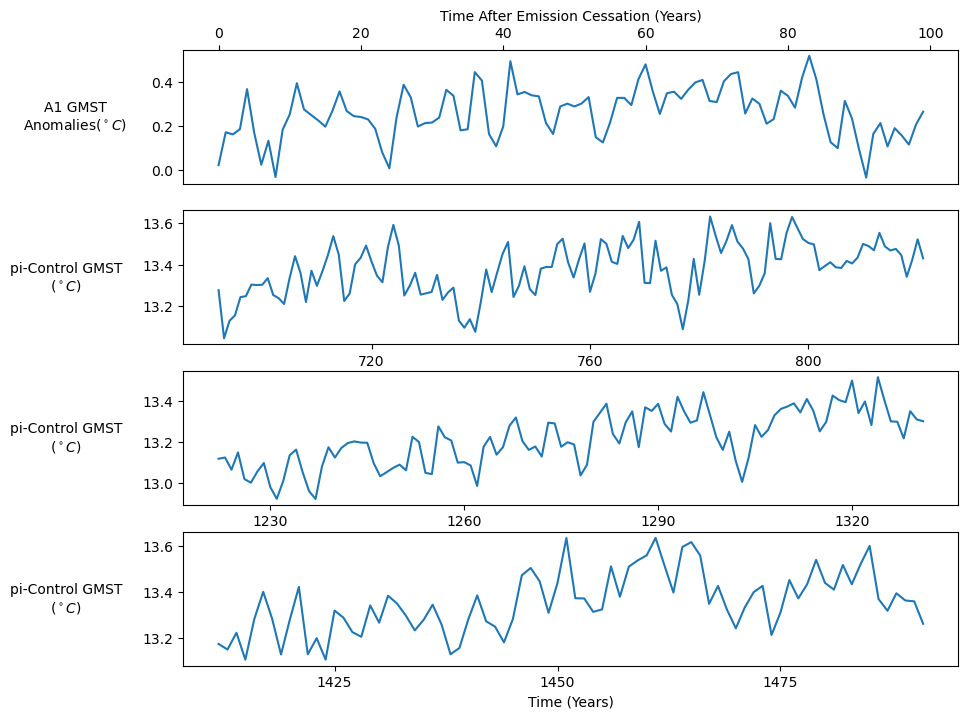

In [360]:
fig,(ax1, ax2, ax3, ax4) = plt.subplots(4, 1,figsize=(10, 8))
# ax2 = ax.twinx()
ax1.plot(a1_smean_anom_ds.sel(model='UKESM1-0-LL').values)
# ax2.plot(esmpi_smean_ds.sel(model='UKESM1-0-LL').isel(time=slice(650, 780)).values)
esmpi_smean_ds.sel(model='UKESM1-0-LL').isel(time=slice(650, 780)).plot(ax=ax2)
esmpi_smean_ds.isel(time=slice(1220, 1330)).sel(model='UKESM1-0-LL').plot(ax=ax3)
esmpi_smean_ds.sel(model='UKESM1-0-LL').isel(time=slice(1410, 1490)).plot(ax=ax4)

ax1.set_ylabel('A1 GMST\nAnomalies' + r'($^\circ C$)', rotation=0, labelpad=55, va='center', ha='center')
ax2.set_ylabel('pi-Control GMST\n' + r'($^\circ C$)', rotation=0, labelpad=55, va='center', ha='center')
ax3.set_ylabel('pi-Control GMST\n' + r'($^\circ C$)', rotation=0, labelpad=55, va='center', ha='center')
ax4.set_ylabel('pi-Control GMST\n' + r'($^\circ C$)', rotation=0, labelpad=55, va='center', ha='center')

ax2.set_xticklabels([int(t.get_text()) for t in ax2.get_xticklabels()[1:]])
# sn_plotting.format_ticks_as_years(ax2, esmpi_smean_ds.sel(model='UKESM1-0-LL').isel(time=slice(650, 780)).time)

ax1.xaxis.set_label_position('top')
ax1.xaxis.tick_top()
ax1.set_xlabel('Time After Emission Cessation (Years)')
ax4.set_xlabel('Time (Years)')

for ax in [ax1, ax2, ax3, ax4]:
    ax.set_title('')

In [361]:
# Manual Calculation for Demonstations
WINDOW=25
# Sample period is the years that we want to look at
sample_period = (0,70) #(1200,1261), 61

# The length of the sample_period varible
window_length = WINDOW
imodel = 2

In [362]:
sample_data = a1_smean_anom_ds.isel(time=slice(*sample_period), model=imodel)
sample_data

<xarray.DataArray 'tas' (time: 70)> Size: 560B
-0.08847 0.06323 0.06065 -0.1351 0.08224 ... -0.4361 -0.4874 -0.3594 -0.4383
Coordinates:
    model     <U14 56B 'CESM2'
    ensemble  <U8 32B 'r1i1p1f1'
  * time      (time) object 560B 0001-12-31 00:00:00 ... 0070-12-31 00:00:00

In [363]:
# import numpy as np
# import matplotlib.pyplot as plt
# import matplotlib.cm as cm
# import matplotlib.colors as mcolors

# # Sample data (replace with your actual data)
# sample_data = np.random.randn(50)

# # Define the range of gradients for normalization
# min_gradient, max_gradient = -1, 1

# # Create a color map
# cmap = cm.get_cmap('RdBu_r')

# # Function to normalize gradients to [0, 1] range
# def normalize_gradient(grad, vmin, vmax):
#     return (grad - vmin) / (vmax - vmin)

# # Prepare the plot
# plt.figure(figsize=(10, 6))

# for window_length in range(10, 41):
#     arr = sample_data[:window_length]
#     x = np.arange(len(arr))
#     coeffs = np.polyfit(x, arr, deg=1)
#     gradient = coeffs[0]  # The gradient is the first coefficient
#     yhat = np.polyval(coeffs, x)
    
#     # Normalize the gradient and get the corresponding color
#     normalized_gradient = normalize_gradient(gradient*window, min_gradient, max_gradient)
#     line_color = cmap(normalized_gradient)
    
#     # Plot the fitted line with the corresponding color
#     plt.plot(x, yhat, color=line_color)
    
# # Plot the original data
# plt.plot(sample_data, label='Original Data')

# # Add a color bar to indicate the gradient mapping
# norm = mcolors.Normalize(vmin=min_gradient, vmax=max_gradient)
# sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
# sm.set_array([])
# cbar = plt.colorbar(sm)
# cbar.set_label('Gradient')

# plt.xlabel('Time')
# plt.ylabel('Value')
# plt.legend()
# plt.show()


In [364]:
# for window_length in range(10, 41):
#     arr = sample_data.isel(time=slice(0, window_length))
#     x = np.arange(len(arr))
#     coeffs= np.polyfit(x, arr, deg=1)
#     yhat = np.polyval(coeffs, x)
#     plt.plot(x, yhat, color='black')
# plt.plot(arr)

In [365]:
sample_data

<xarray.DataArray 'tas' (time: 70)> Size: 560B
-0.08847 0.06323 0.06065 -0.1351 0.08224 ... -0.4361 -0.4874 -0.3594 -0.4383
Coordinates:
    model     <U14 56B 'CESM2'
    ensemble  <U8 32B 'r1i1p1f1'
  * time      (time) object 560B 0001-12-31 00:00:00 ... 0070-12-31 00:00:00

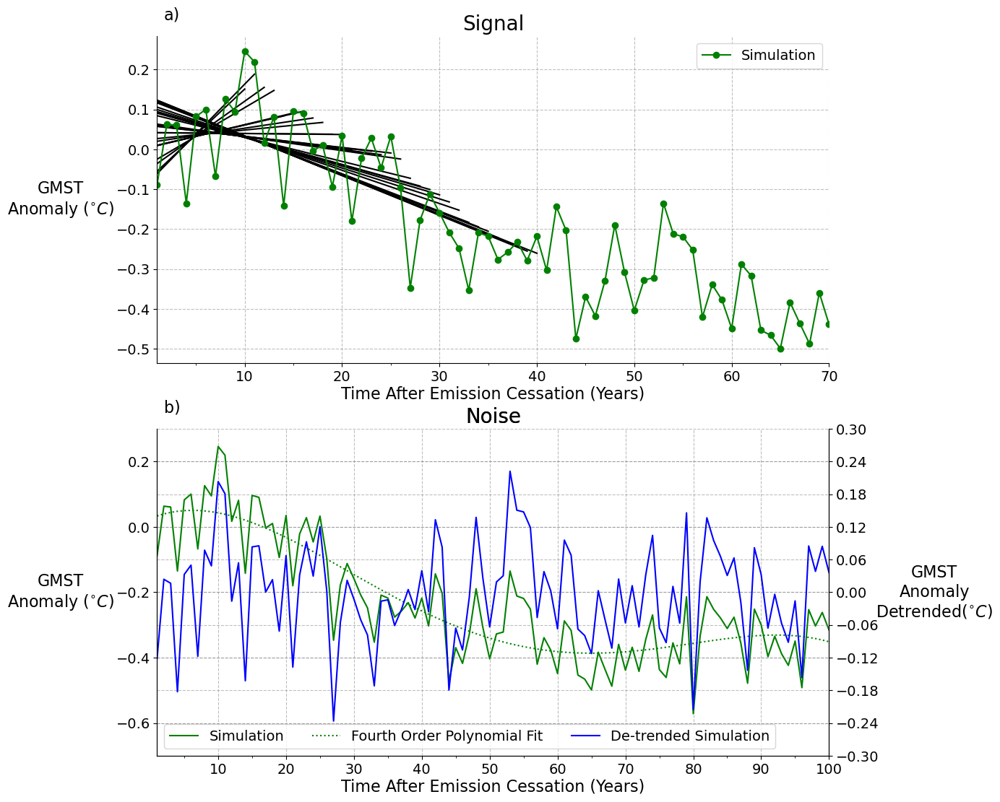

In [366]:
plt.style.use('default')
fig = plt.figure(figsize=(12,20))
axes = [fig.add_subplot(3,1,i) for i in range(1,3)]


# ---> axes[0]
# axes[0].plot(sample_data.time.dt.year.values, a1_smean_anom_trendfit_ds.isel(time=slice(*sample_period), model=imodel),
#              label='Linear Trend Fit', color='blue')

for window_length in range(10, 41):
    arr = sample_data.isel(time=slice(0, window_length))
    x = np.arange(len(arr))
    coeffs= np.polyfit(x, arr, deg=1)
    yhat = np.polyval(coeffs, x)
    axes[0].plot(sample_data.time.dt.year.values[:len(yhat)], yhat, color='black')

axes[0].plot(sample_data.time.dt.year.values, sample_data.values, marker='o', label='Simulation', color='green')


axes[0].set_xlim(sample_data.time.dt.year.values[0], sample_data.time.dt.year.values[-1])
axes[0].legend(ncol=2, fontsize=constants.PlotConfig.legend_text_size)

plotting_functions.format_axis(axes[0], title='Signal', xlabel='Time After Emission Cessation (Years)', ylabel='GMST\n'+r'Anomaly ($^{\circ}C$)',
                               labelpad=55, invisible_spines=['top', 'right'])
plotting_functions.add_figure_label(axes[0], 'a)')
sn_plotting.format_ticks_as_years(axes[0], sample_data.time.dt.year.values, logginglevel='ERROR')

# ---> axes[1]
ax1 = axes[1]; ax2 = axes[1].twinx()
time = a1_smean_anom_ds.time.dt.year.values
lns1 = ax1.plot(time, a1_smean_anom_ds.isel(model=imodel).values, color='green', label='Simulation')
lns2 = ax1.plot(time, a1_smean_anom_trendfit_ds.isel(model=imodel).values, label='Fourth Order Polynomial Fit', color='green', linestyle=':')
lns3 = ax2.plot(time, a1_smean_anom_detrend_ds.isel(model=imodel).values, label='De-trended Simulation', color='blue')
sn_plotting.format_ticks_as_years(axes[1], time, logginglevel='ERROR')
axes[1].set_xlim(np.take(time, [0, -1]))


plotting_functions.match_ticks(ax1, ax2, 'left')

lns = lns1+lns2+lns3
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, ncol=3, loc='best', fontsize=constants.PlotConfig.legend_text_size)

plotting_functions.format_axis(ax1, title='Noise', xlabel='Time After Emission Cessation (Years)', ylabel='GMST\n'+r'Anomaly ($^{\circ}C$)',
                               labelpad=55, invisible_spines=['top'])
plotting_functions.format_axis(ax2, title='Noise', ylabel='GMST\nAnomaly\nDetrended' + r'($^{\circ}C$)',
                               labelpad=55, invisible_spines=['top'])
plotting_functions.add_figure_label(ax1, 'b)')

In [367]:
experiment_params = constants.EXPERIMENTS_TO_RUN[0]
experiment_params

{'variable': 'tas', 'mask': None, 'hemisphere': 'global'}

In [368]:
units = constants.VARIABLE_INFO[experiment_params["variable"]]["units"]
longname = constants.VARIABLE_INFO[experiment_params["variable"]]['longname']
hemisphere_title = string.capwords(experiment_params['hemisphere'].replace('_', ' '))
mask_title = f'({experiment_params["mask"]} only)' if experiment_params["mask"] else ''

In [369]:
rolling_year_stable_ds

<xarray.DataArray (window: 31, model: 9)> Size: 2kB
0.0 5.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 ... 15.0 0.0 39.0 16.0 9.0 35.0 0.0 13.0 0.0
Coordinates:
  * model     (model) <U14 504B 'MPI-ESM1-2-LR' ... 'UKESM1-0-LL'
  * window    (window) int64 248B 10 11 12 13 14 15 16 ... 34 35 36 37 38 39 40
    ensemble  (model) <U8 288B 'r1i1p1f1' 'r1i1p1f1' ... 'r1i1p1f1' 'r1i1p1f2'

In [370]:
# static_year_stable_ds=static_year_stable_ds.to_dataset(name='time')
rolling_year_stable_ds=rolling_year_stable_ds.to_dataset(name='time')

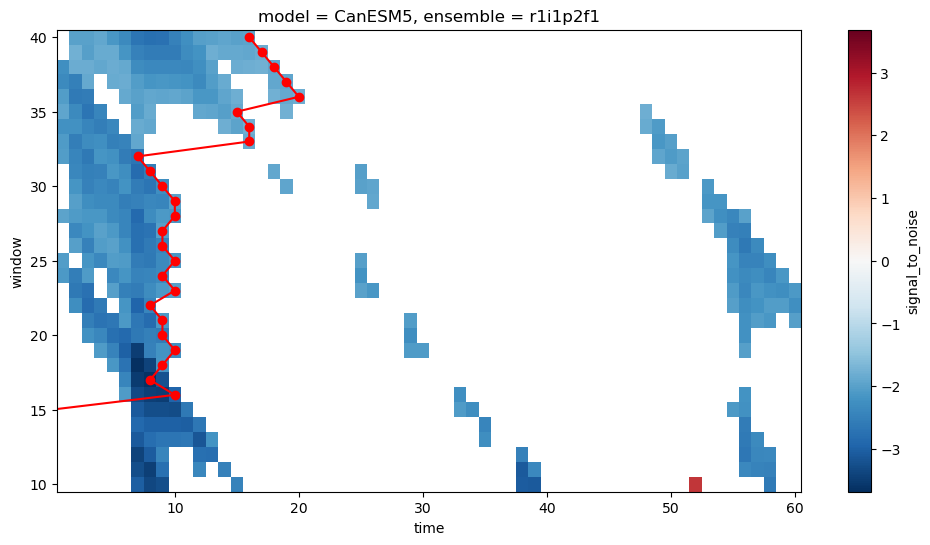

In [371]:
fig = plt.figure(figsize=(12, 6))
unstable_rolling_ds.sel(model='CanESM5').signal_to_noise.plot(y='window')
rolling_year_stable_ds.time.sel(model='CanESM5').plot(y='window', marker='o', color='red')

In [372]:
static_year_stable_ds = static_year_stable_ds.to_dataset(name='time')

AttributeError: 'Dataset' object has no attribute 'to_dataset'

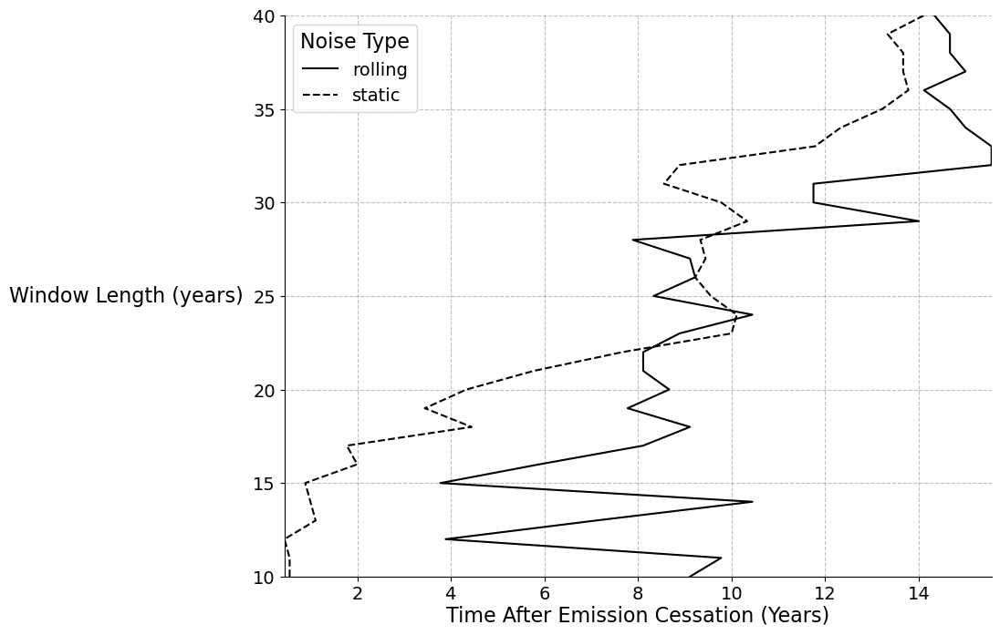

In [373]:
fig, ax = sn_plotting.plot_average_stable_year(static_year_stable_ds, rolling_year_stable_ds, 
                                               xlabel='Time After Emission Cessation (Years)')

In [374]:
#### Note, this dictionary has also been put into constants as ZECMIP_MODEL_COLORS

# Create a list of models and their corresponding values
model_values = [(model, zec50_ds.sel(model=model).values.round(3)) for model in zec50_ds.model.values]

# Separate negative and positive values
negative_values = [(model, value) for model, value in model_values if value < 0]
positive_values = [(model, value) for model, value in model_values if value > 0]

# Sort the values by their absolute magnitude
negative_values.sort(key=lambda x: abs(x[1]))
positive_values.sort(key=lambda x: abs(x[1]))

# Create a colormap for negative values (BuPu_r) and positive values (OrRd)
# For the Blues we want to remove the three lower values there are too hard to see.  For the reds, just make sure it
# isn't the lower values. 
cut1 = 2
negative_colors = blue_colors = [
    '#add8e6',  # Light Blue
    '#87ceeb',  # Sky Blue
    '#6495ed',  # Cornflower Blue
    '#4169e1',  # Royal Blue
    '#1e90ff',  # Dodger Blue
    '#0000cd',  # Medium Blue
    '#00008b'   # Dark Blue
]
negative_line_styles = [
    '-',                # Solid
    '--',               # Dashed
    '-.',               # Dash-dot
    ':',                # Dotted
    '-',       # More frequent dashes, shorter space
    (0, (1, 1)),        # Densely dotted
    (0, (5, 1, 1, 1)),  # Dash, dot, dot, dot
]


#['#add8e6', '#87cefa', '#6495ed', '#4169e1', '#0000ff']#plt.cm.get_cmap('BuPu_r', len(negative_values)+cut1)(np.arange(len(negative_values)+cut1))[:-cut1]
positive_colors = plt.cm.get_cmap('OrRd', len(positive_values)+4)(np.arange(len(positive_values)+4))[::2][-2:]

# Create dictionaries for negative and positive values with color information
negative_zec50 = {model: {'value': value, 'color': color, 'linestyle':linestyle} for (model, value), color, linestyle in zip(negative_values, negative_colors, negative_line_styles)}
positive_zec50 = {model: {'value': value, 'color': color} for (model, value), color in zip(positive_values, positive_colors)}

# Combine the dictionaries into the final zec50_dict
zec50_dict = {**negative_zec50, **positive_zec50}
zec50_dict

{'GISS-E2-1-G-CC': {'value': -0.09, 'color': '#add8e6', 'linestyle': '-'},
 'CanESM5': {'value': -0.102, 'color': '#87ceeb', 'linestyle': '--'},
 'MIROC-ES2L': {'value': -0.109, 'color': '#6495ed', 'linestyle': '-.'},
 'GFDL-ESM4': {'value': -0.205, 'color': '#4169e1', 'linestyle': ':'},
 'MPI-ESM1-2-LR': {'value': -0.27, 'color': '#1e90ff', 'linestyle': '-'},
 'CESM2': {'value': -0.31, 'color': '#0000cd', 'linestyle': (0, (1, 1))},
 'NorESM2-LM': {'value': -0.334,
  'color': '#00008b',
  'linestyle': (0, (5, 1, 1, 1))},
 'ACCESS-ESM1-5': {'value': 0.011, 'color': array([0.99, 0.7 , 0.48, 1.  ])},
 'UKESM1-0-LL': {'value': 0.289, 'color': array([0.79, 0.11, 0.07, 1.  ])}}

In [375]:
rolling_year_stable_ds.sel(window=40).time.squeeze().to_pandas().to_dict()

{'MPI-ESM1-2-LR': 15.0,
 'ACCESS-ESM1-5': 0.0,
 'CESM2': 39.0,
 'CanESM5': 16.0,
 'GFDL-ESM4': 9.0,
 'GISS-E2-1-G-CC': 35.0,
 'MIROC-ES2L': 0.0,
 'NorESM2-LM': 13.0,
 'UKESM1-0-LL': 0.0}

Text(0.5, 1.0, '')

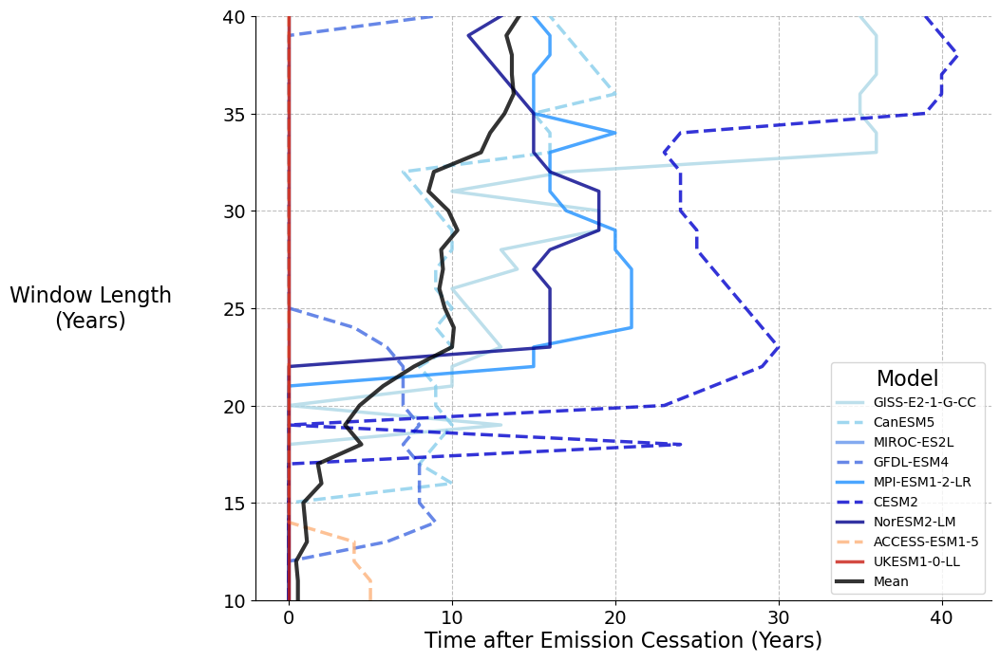

In [376]:
plt.style.use('default')
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111)

for num, model in enumerate(zec50_dict):
    color = zec50_dict[model]['color']
    linestyle = '-' if not num%2 else '--'#zec50_dict[model]['linestyle'] if 'linestyle' in zec50_dict[model] else '-'
    rolling_year_stable_ds.sel(model=model).time.plot(ax=ax, y='window', linewidth=2.5, alpha=0.8, color=color, label=model, linestyle=linestyle)
        
rolling_year_stable_ds.time.mean(dim='model').plot(ax=ax, y='window', linewidth=3, alpha=0.8, color='k', label='Mean')     
leg = ax.legend()
leg.set_title('Model')
leg.get_title().set_fontsize(constants.PlotConfig.legend_title_size)
plotting_functions.format_axis(ax, xlabel='Time after Emission Cessation (Years)', ylabel='Window Length\n(Years)', invisible_spines=['top', 'right'])
ax.set_ylim([10, 40])
ax.set_title('')

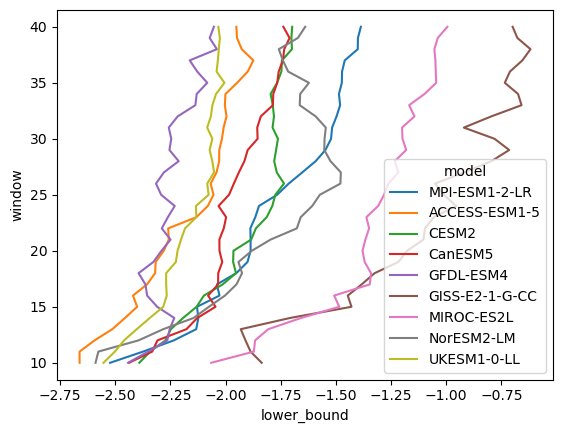

In [377]:
sn_multi_rolling_ds.lower_bound.plot(hue='model', y='window');

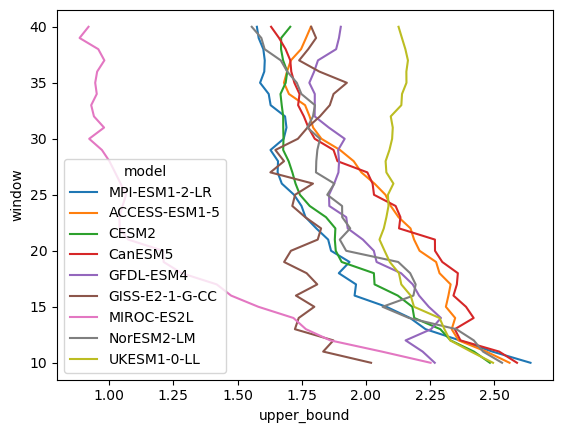

In [378]:
sn_multi_rolling_ds.upper_bound.plot(hue='model', y='window');

In [379]:
# stability_colorplot_kwargs = dict(max_color_lim=max_effective_length, xlims=(0, 90), patch=True, ax2_ylabel=f'GMST Anomaly({units})',
#                                   cmap='RdBu_r', bbox_to_anchor=(1, 1.4), labelpad_left=65, labelpad_right=15, extend='both',
#                                   cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise\nRatio', hspace=0.2,
#                                   return_all=True, rotation=90)
sn_levels = np.arange(-4.5, 4.5+.5, 0.5)
stability_colorplot_kwargs = dict(max_color_lim=max_effective_length, xlims=(0, 90), patch=True, ax2_ylabel='', ylabel='',
                                  cmap='RdBu_r', bbox_to_anchor=(1, 1.4), labelpad_left=65, labelpad_right=15, extend='both',
                                  cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio', hspace=0.2,
                                  return_all=True, rotation=90)

In [380]:
to_concat = []
for window in rolling_year_stable_ds.window.values:
    window_ds = rolling_year_stable_ds.sel(window=window)
    window_ds_pw = window_ds.copy(deep=True) + window
    window_ds_pw = xr.where(window_ds==0, 0, window_ds_pw)
    to_concat.append(window_ds_pw)
rolling_year_stable_ds_plus_window = xr.concat(to_concat, dim='window')

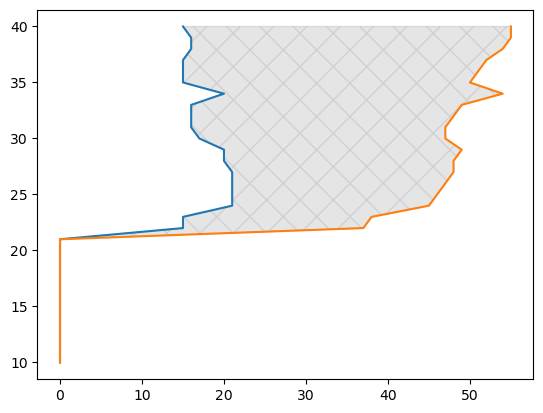

In [381]:
tds = rolling_year_stable_ds.isel(model=0).squeeze()
tds2 = rolling_year_stable_ds_plus_window.isel(model=0).squeeze()

plt.plot(tds.time.values, tds.window.values)

plt.plot(tds2.time.values, tds2.window.values)
plt.fill_betweenx(tds.window.values, tds.time.values, tds2.time.values,
                  color='grey', alpha=0.2, hatch='x')

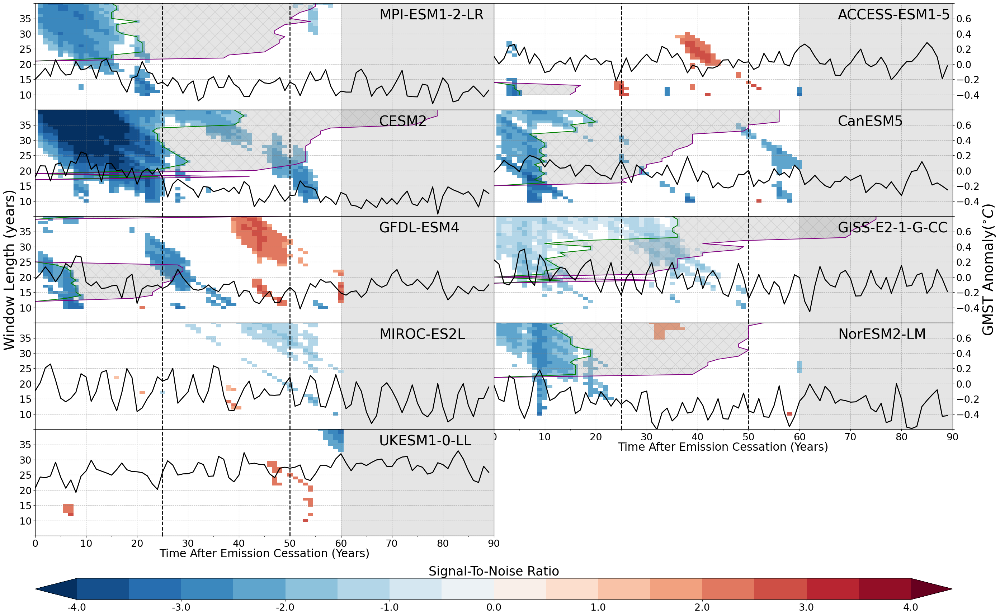

In [382]:
%matplotlib inline
models = unstable_rolling_ds.model.values

num_plots = len(models)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0)
axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]
font_scale = 1.4
for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    #ax.set_ylim(8, 41)
    fig, returned_axes = sn_plotting.sn_multi_window_in_time(
        unstable_rolling_ds.sel(model=model).squeeze().signal_to_noise,
        temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
        #stable_point_ds = rolling_year_stable_ds_plus_window.sel(model=model),#rolling_year_stable_ds.sel(model=model),
        fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
        axes_title='', yticks_right = np.arange(-0.6, 1, .2), **stability_colorplot_kwargs) 
    ax, ax2, cax = returned_axes
    ax.axvline(unstable_rolling_ds.time.values[24], 0, 1000, color='k', linewidth=2, linestyle='--')
    ax.axvline(unstable_rolling_ds.time.values[49], 0, 1000, color='k', linewidth=2, linestyle='--')
    

    # Adding the stabilisation year and theb fill between
    tds = rolling_year_stable_ds.sel(model=model).squeeze()
    tds2 = rolling_year_stable_ds_plus_window.sel(model=model).squeeze()
    
    ax.plot(tds.time.values, tds.window.values, color='green')
    ax.plot(tds2.time.values, tds2.window.values, color='purple')
    
    ax.fill_betweenx(tds.window.values, tds.time.values, tds2.time.values,
                      color='grey', alpha=0.2, hatch='x')
    
    # rolling_year_stable_ds_plus_window.time.sel(model=model).plot(ax=ax, y='window')
    # rolling_year_stable_ds.time.sel(model=model).plot(ax=ax, y='window')
    if (num+1)%2: # Left plot
        ax2.set_yticks([])
        ax2.set_yticklabels([])
        plotting_functions.clip_axis_ends(ax)
    else: # Right plot
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.set_ylabel(' ')
        plotting_functions.clip_axis_ends(ax2)

    ax.set_ylabel('')
    if num  == 4: ax.set_ylabel('Window Length (years)', size=constants.PlotConfig.title_size*font_scale)
    if num  == 5: ax2.set_ylabel(f'GMST Anomaly({units})', size=constants.PlotConfig.title_size*font_scale)
    ax.annotate(model, xy=(0.75, 0.85), xycoords='axes fraction', ha='left', size=constants.PlotConfig.title_size*font_scale)
    
    if num < 7:
        ax.set_xticklabels([])
        ax.set_xlabel('')

In [383]:
year_of_stabilisation_df

,year,window,temp,av_temp
MPI-ESM1-2-LR,21.0,24.0,0.033933,-0.24
ACCESS-ESM1-5,5.0,10.0,0.108739,0.03
CESM2,41.0,38.0,-0.143812,-0.31
CanESM5,20.0,36.0,-0.017555,-0.02
GFDL-ESM4,9.0,14.0,0.264656,-0.09
GISS-E2-1-G-CC,36.0,33.0,-0.018558,-0.07
MIROC-ES2L,0.0,10.0,-0.096023,-0.03
NorESM2-LM,19.0,29.0,-0.244266,-0.30
UKESM1-0-LL,0.0,10.0,0.023185,0.21


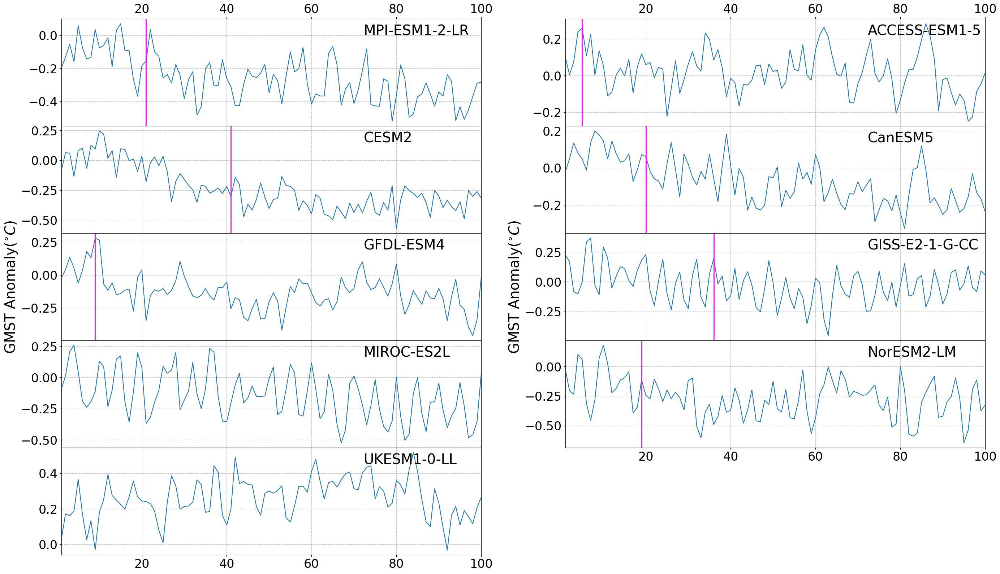

In [384]:
# %matplotlib inline
models = a1_smean_anom_ds.model.values
font_scale = 1.4

stability_colorplot_kwargs = dict(max_color_lim=max_effective_length, xlims=(0, 90), patch=True, ax2_ylabel='', ylabel='',
                                  cmap='RdBu_r', bbox_to_anchor=(1, 1.4), labelpad_left=65, labelpad_right=15, extend='both',
                                  cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio', hspace=0.2,
                                  return_all=True, rotation=90)

num_plots = len(models)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0.2)
axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

for num, model in enumerate(models):
    

    ax = axes[num]
    ax.plot(a1_smean_anom_ds.time.dt.year.values, a1_smean_anom_ds.sel(model=model).values)
    # a1_smean_anom_ds.squeeze().sel(model=model).plot(ax=ax)

    
    
#     ax.axvline(a1_smean_anom_ds.time.values[24], 0, 1000, color='k', linewidth=2, linestyle='--')
#     ax.axvline(a1_smean_anom_ds.time.values[49], 0, 1000, color='k', linewidth=2, linestyle='--')
    year_of_stabilisation_model =  year_of_stabilisation_df.loc[model].year
    y_scatter = year_of_stabilisation_df.loc[model].temp
    ax.axvline(year_of_stabilisation_model, 0, 1000, color='fuchsia', linewidth=2, linestyle='-')
    
    ax.set_xlim(*np.take(a1_smean_anom_ds.time.dt.year.values, [0, -1]))
    ax.set_ylabel('')
    if num  in [4, 5]: ax.set_ylabel(f'GMST Anomaly({units})', size=constants.PlotConfig.title_size*font_scale)
    ax.annotate(model, xy=(0.72, 0.85), xycoords='axes fraction', ha='left', 
                size=constants.PlotConfig.title_size*font_scale)
    if num <= 1:
        ax.xaxis.set_label_position('top')
        ax.xaxis.tick_top()
    
    
    if 1 < num < 7:
        ax.set_xticklabels([])
        ax.set_xlabel('')
    else:
        ax.tick_params(axis='x', labelsize=24)

    ax.grid(True, linestyle='--', alpha=0.5, color='grey')
    ax.tick_params(axis='y', labelsize=24)


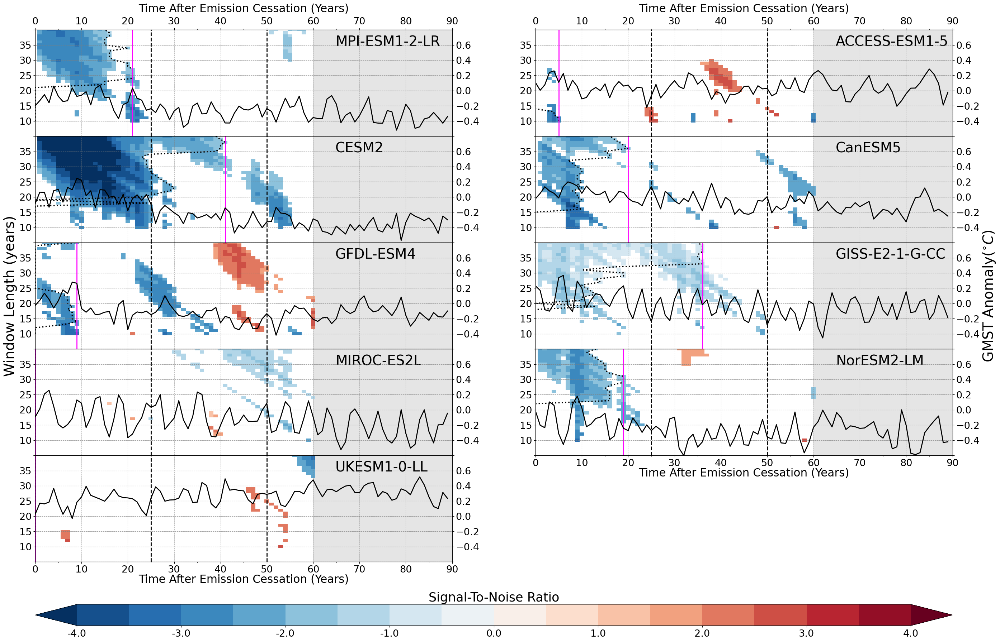

In [385]:
%matplotlib inline
models = unstable_rolling_ds.model.values
font_scale = 1.4

stability_colorplot_kwargs = dict(max_color_lim=max_effective_length, xlims=(0, 90), patch=True, ax2_ylabel='', ylabel='',
                                  cmap='RdBu_r', bbox_to_anchor=(1, 1.4), labelpad_left=65, labelpad_right=15, extend='both',
                                  cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio', hspace=0.2,
                                  return_all=True, rotation=90)

num_plots = len(models)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0.2)
axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    
    fig, returned_axes = sn_plotting.sn_multi_window_in_time(
        unstable_rolling_ds.sel(model=model).squeeze().signal_to_noise,
        temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
        stable_point_ds = rolling_year_stable_ds.sel(model=model),#rolling_year_stable_ds.sel(model=model),
        fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
        axes_title='', yticks_right = np.arange(-0.6, 1, .2), **stability_colorplot_kwargs) 
    
    ax, ax2, cax = returned_axes
    
    ax.axvline(unstable_rolling_ds.time.values[24], 0, 1000, color='k', linewidth=2, linestyle='--')
    ax.axvline(unstable_rolling_ds.time.values[49], 0, 1000, color='k', linewidth=2, linestyle='--')
    year_of_stabilisation_model =  year_of_stabilisation_df.loc[model].year
    y_scatter = year_of_stabilisation_df.loc[model].temp
    ax.axvline(year_of_stabilisation_model, 0, 1000, color='fuchsia', linewidth=2, linestyle='-')
    # ax2.scatter(year_of_stabilisation_model, y_scatter, zorder=100, s=240, color='fuchsia', marker='o')
    #ax.set_ylim(9, 40)

    plotting_functions.clip_axis_ends(ax)
    plotting_functions.clip_axis_ends(ax2)

    ax.set_ylabel('')
    if num  == 4: ax.set_ylabel('Window Length (years)', size=constants.PlotConfig.title_size*font_scale)
    if num  == 5: ax2.set_ylabel(f'GMST Anomaly({units})', size=constants.PlotConfig.title_size*font_scale)
    ax.annotate(model, xy=(0.72, 0.85), xycoords='axes fraction', ha='left', size=constants.PlotConfig.title_size*font_scale)
    if num <= 1:
        ax.xaxis.set_label_position('top')
        ax.xaxis.tick_top()
    
    if 1 < num < 7:
        ax.set_xticklabels([])
        ax.set_xlabel('')

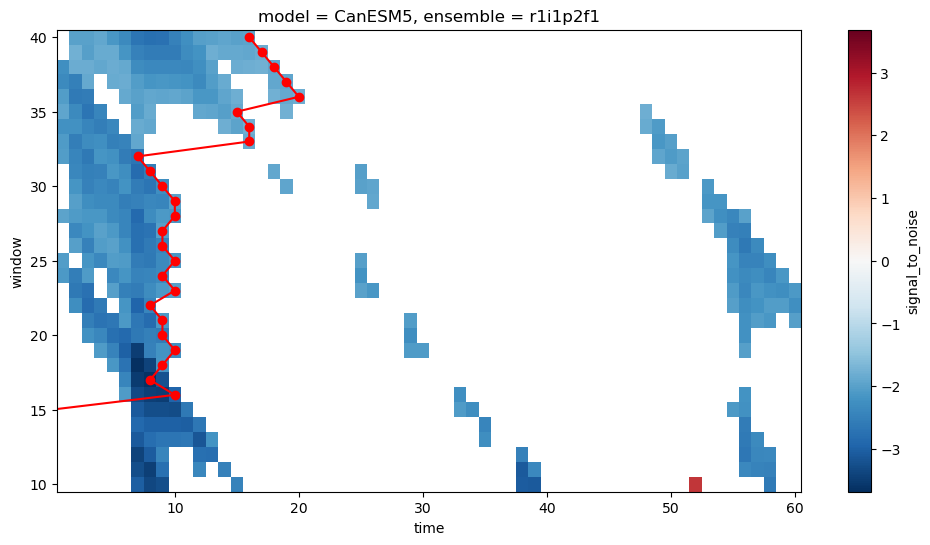

In [386]:
fig = plt.figure(figsize=(12, 6))
unstable_rolling_ds.sel(model='CanESM5').signal_to_noise.plot(y='window')
rolling_year_stable_ds.time.sel(model='CanESM5').plot(y='window', marker='o', color='red')

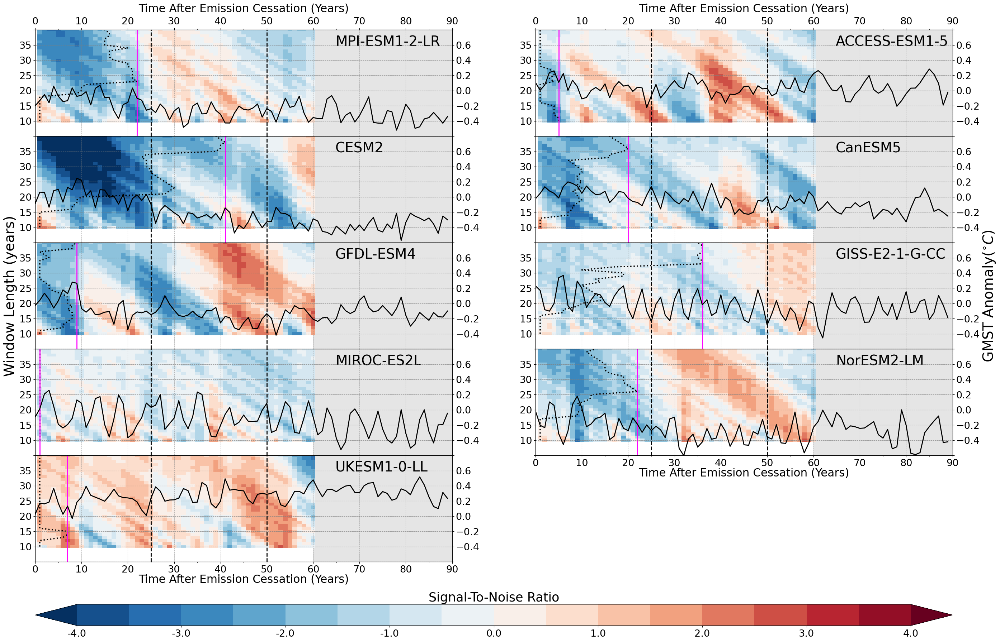

In [225]:
%matplotlib inline
models = unstable_rolling_ds.model.values
font_scale = 1.4

stability_colorplot_kwargs = dict(max_color_lim=max_effective_length, xlims=(0, 90), patch=True, ax2_ylabel='', ylabel='',
                                  cmap='RdBu_r', bbox_to_anchor=(1, 1.4), labelpad_left=65, labelpad_right=15, extend='both',
                                  cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio', hspace=0.2,
                                  return_all=True, rotation=90)

num_plots = len(models)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0.2)
axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    
    fig, returned_axes = sn_plotting.sn_multi_window_in_time(
        sn_multi_rolling_ds.sel(model=model).squeeze().signal_to_noise,
        temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
        stable_point_ds = rolling_year_stable_ds.sel(model=model),#rolling_year_stable_ds.sel(model=model),
        fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
        axes_title='', yticks_right = np.arange(-0.6, 1, .2), **stability_colorplot_kwargs) 
    
    ax, ax2, cax = returned_axes
    
    ax.axvline(unstable_rolling_ds.time.values[24], 0, 1000, color='k', linewidth=2, linestyle='--')
    ax.axvline(unstable_rolling_ds.time.values[49], 0, 1000, color='k', linewidth=2, linestyle='--')
    year_of_stabilisation_model =  year_of_stabilisation_df.loc[model].year
    y_scatter = year_of_stabilisation_df.loc[model].temp
    ax.axvline(year_of_stabilisation_model, 0, 1000, color='fuchsia', linewidth=2, linestyle='-')
    # ax2.scatter(year_of_stabilisation_model, y_scatter, zorder=100, s=240, color='fuchsia', marker='o')
    #ax.set_ylim(9, 40)

    plotting_functions.clip_axis_ends(ax)
    plotting_functions.clip_axis_ends(ax2)

    ax.set_ylabel('')
    if num  == 4: ax.set_ylabel('Window Length (years)', size=constants.PlotConfig.title_size*font_scale)
    if num  == 5: ax2.set_ylabel(f'GMST Anomaly({units})', size=constants.PlotConfig.title_size*font_scale)
    ax.annotate(model, xy=(0.72, 0.85), xycoords='axes fraction', ha='left', size=constants.PlotConfig.title_size*font_scale)
    if num <= 1:
        ax.xaxis.set_label_position('top')
        ax.xaxis.tick_top()
    
    if 1 < num < 7:
        ax.set_xticklabels([])
        ax.set_xlabel('')

In [226]:
signal_colorplot_kwargs = {'max_color_lim': 60,
 'xlims': (0, 90),
 'patch': True,
 'ax2_ylabel': '',
 'ylabel': '',
 'cmap': 'RdBu_r',
 'bbox_to_anchor': (1, 1.4),
 'labelpad_left': 65,
 'labelpad_right': 15,
 'extend': 'both',
 'cut_ticks': 2,
 'vmax': .4,
 'step': 0.05,
 'font_scale': 1.4,
 'cbar_label': 'Signal (K)',
 'hspace': 0.2,
 'return_all': True,
 'rotation': 90}

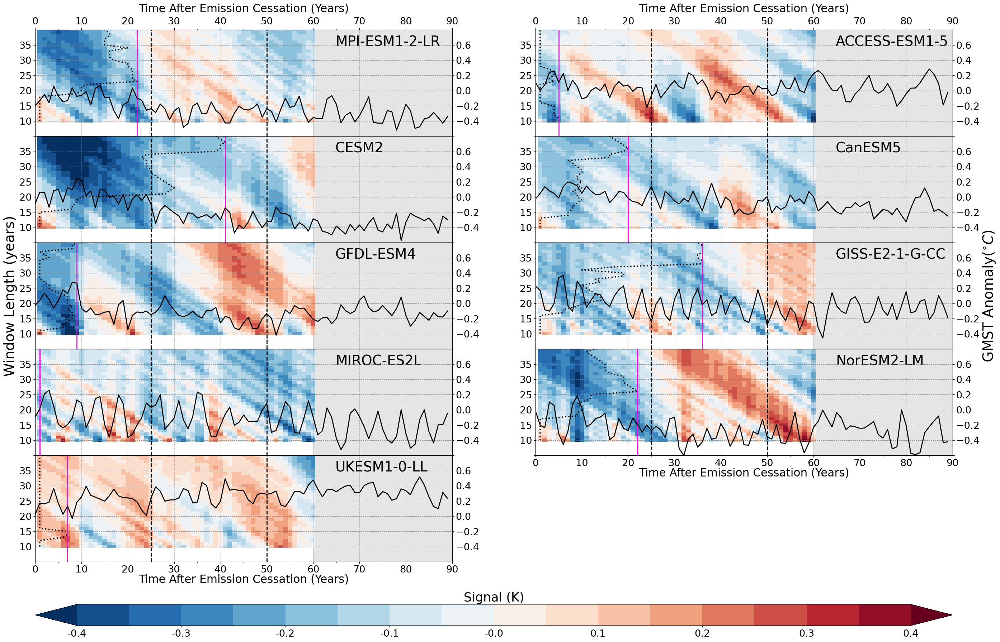

In [227]:
%matplotlib inline
models = unstable_rolling_ds.model.values
font_scale = 1.4

stability_colorplot_kwargs = dict(max_color_lim=max_effective_length, xlims=(0, 90), patch=True, ax2_ylabel='', ylabel='',
                                  cmap='RdBu_r', bbox_to_anchor=(1, 1.4), labelpad_left=65, labelpad_right=15, extend='both',
                                  cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio', hspace=0.2,
                                  return_all=True, rotation=90)

num_plots = len(models)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0.2)
axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    
    fig, returned_axes = sn_plotting.sn_multi_window_in_time(
        sn_multi_rolling_ds.sel(model=model).squeeze().signal,
        temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
        stable_point_ds = rolling_year_stable_ds.sel(model=model),#rolling_year_stable_ds.sel(model=model),
        fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
        axes_title='', yticks_right = np.arange(-0.6, 1, .2), **signal_colorplot_kwargs) 
    
    ax, ax2, cax = returned_axes
    
    ax.axvline(unstable_rolling_ds.time.values[24], 0, 1000, color='k', linewidth=2, linestyle='--')
    ax.axvline(unstable_rolling_ds.time.values[49], 0, 1000, color='k', linewidth=2, linestyle='--')
    year_of_stabilisation_model =  year_of_stabilisation_df.loc[model].year
    y_scatter = year_of_stabilisation_df.loc[model].temp
    ax.axvline(year_of_stabilisation_model, 0, 1000, color='fuchsia', linewidth=2, linestyle='-')
    # ax2.scatter(year_of_stabilisation_model, y_scatter, zorder=100, s=240, color='fuchsia', marker='o')
    #ax.set_ylim(9, 40)

    plotting_functions.clip_axis_ends(ax)
    plotting_functions.clip_axis_ends(ax2)

    ax.set_ylabel('')
    if num  == 4: ax.set_ylabel('Window Length (years)', size=constants.PlotConfig.title_size*font_scale)
    if num  == 5: ax2.set_ylabel(f'GMST Anomaly({units})', size=constants.PlotConfig.title_size*font_scale)
    ax.annotate(model, xy=(0.72, 0.85), xycoords='axes fraction', ha='left', size=constants.PlotConfig.title_size*font_scale)
    if num <= 1:
        ax.xaxis.set_label_position('top')
        ax.xaxis.tick_top()
    
    if 1 < num < 7:
        ax.set_xticklabels([])
        ax.set_xlabel('')

In [228]:
noise_colorplot_kwargs = {'max_color_lim': 60,
 'xlims': (0, 90),
 'patch': True,
 'ax2_ylabel': '',
 'ylabel': '',
 'cmap': 'RdBu_r',
 'bbox_to_anchor': (1, 1.4),
 'labelpad_left': 65,
 'labelpad_right': 15,
 'extend': 'both',
 'cut_ticks': 2,
 'vmax': .2,
 'step': 0.025,
 'font_scale': 1.4,
 'cbar_label': 'Noise (K)',
 'hspace': 0.2,
 'return_all': True,
 'rotation': 90}

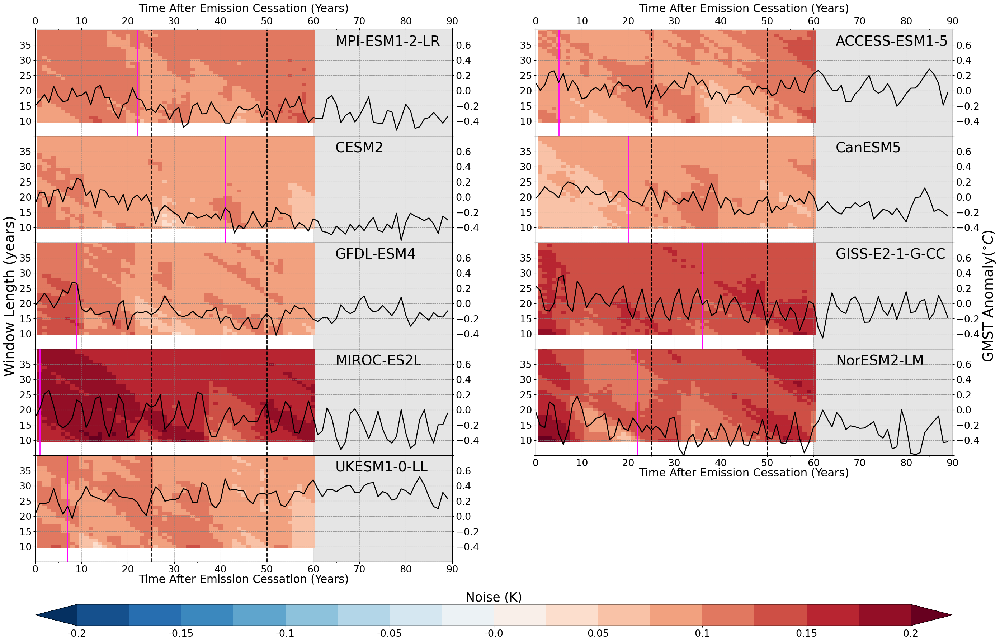

In [229]:
%matplotlib inline
models = unstable_rolling_ds.model.values
font_scale = 1.4

stability_colorplot_kwargs = dict(max_color_lim=max_effective_length, xlims=(0, 90), patch=True, ax2_ylabel='', ylabel='',
                                  cmap='RdBu_r', bbox_to_anchor=(1, 1.4), labelpad_left=65, labelpad_right=15, extend='both',
                                  cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio', hspace=0.2,
                                  return_all=True, rotation=90)

num_plots = len(models)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0.2)
axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    
    fig, returned_axes = sn_plotting.sn_multi_window_in_time(
        sn_multi_rolling_ds.sel(model=model).squeeze().noise,
        temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
        # stable_point_ds = rolling_year_stable_ds.sel(model=model),#rolling_year_stable_ds.sel(model=model),
        fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
        axes_title='', yticks_right = np.arange(-0.6, 1, .2), **noise_colorplot_kwargs) 
    
    ax, ax2, cax = returned_axes
    
    ax.axvline(unstable_rolling_ds.time.values[24], 0, 1000, color='k', linewidth=2, linestyle='--')
    ax.axvline(unstable_rolling_ds.time.values[49], 0, 1000, color='k', linewidth=2, linestyle='--')
    year_of_stabilisation_model =  year_of_stabilisation_df.loc[model].year
    y_scatter = year_of_stabilisation_df.loc[model].temp
    ax.axvline(year_of_stabilisation_model, 0, 1000, color='fuchsia', linewidth=2, linestyle='-')
    # ax2.scatter(year_of_stabilisation_model, y_scatter, zorder=100, s=240, color='fuchsia', marker='o')
    #ax.set_ylim(9, 40)

    plotting_functions.clip_axis_ends(ax)
    plotting_functions.clip_axis_ends(ax2)

    ax.set_ylabel('')
    if num  == 4: ax.set_ylabel('Window Length (years)', size=constants.PlotConfig.title_size*font_scale)
    if num  == 5: ax2.set_ylabel(f'GMST Anomaly({units})', size=constants.PlotConfig.title_size*font_scale)
    ax.annotate(model, xy=(0.72, 0.85), xycoords='axes fraction', ha='left', size=constants.PlotConfig.title_size*font_scale)
    if num <= 1:
        ax.xaxis.set_label_position('top')
        ax.xaxis.tick_top()
    
    if 1 < num < 7:
        ax.set_xticklabels([])
        ax.set_xlabel('')

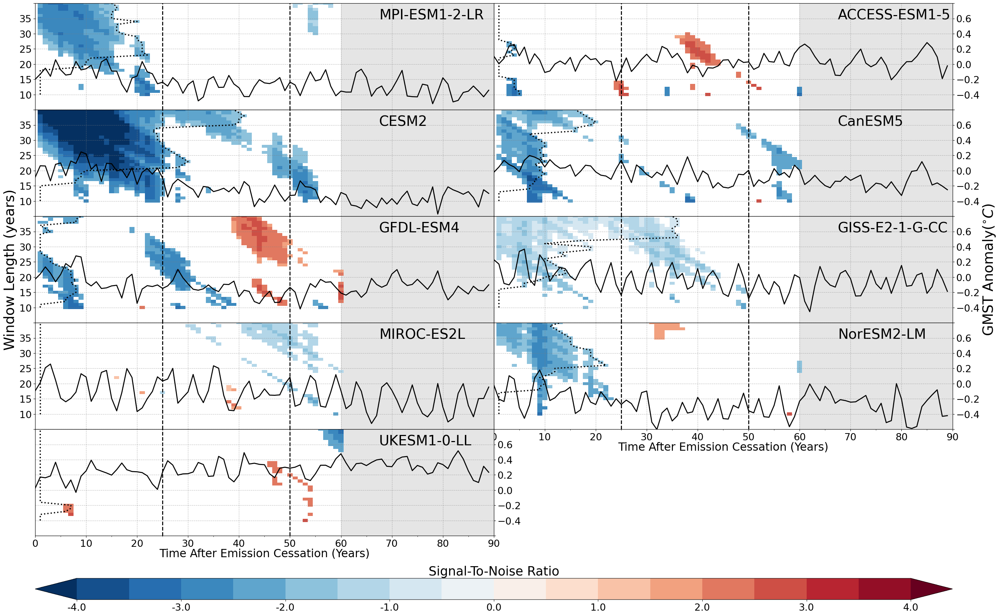

In [230]:
%matplotlib inline
models = unstable_rolling_ds.model.values

num_plots = len(models)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0)
axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    
    fig, returned_axes = sn_plotting.sn_multi_window_in_time(
        unstable_rolling_ds.sel(model=model).squeeze().signal_to_noise,
        temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
        stable_point_ds = rolling_year_stable_ds.sel(model=model),#rolling_year_stable_ds.sel(model=model),
        fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
        axes_title='', yticks_right = np.arange(-0.6, 1, .2), **stability_colorplot_kwargs) 
    ax, ax2, cax = returned_axes
    ax.axvline(unstable_rolling_ds.time.values[24], 0, 1000, color='k', linewidth=2, linestyle='--')
    ax.axvline(unstable_rolling_ds.time.values[49], 0, 1000, color='k', linewidth=2, linestyle='--')
    #ax.set_ylim(9, 40)

    if (num+1)%2 and num<7: # Left plot
        ax2.set_yticks([])
        ax2.set_yticklabels([])
        plotting_functions.clip_axis_ends(ax)
    else: # Right plot
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.set_ylabel(' ')
        plotting_functions.clip_axis_ends(ax2)

    ax.set_ylabel('')
    if num  == 4: ax.set_ylabel('Window Length (years)', size=constants.PlotConfig.title_size*font_scale)
    if num  == 5: ax2.set_ylabel(f'GMST Anomaly({units})', size=constants.PlotConfig.title_size*font_scale)
    ax.annotate(model, xy=(0.75, 0.85), xycoords='axes fraction', ha='left', size=constants.PlotConfig.title_size*font_scale)
    
    if num < 7:
        ax.set_xticklabels([])
        ax.set_xlabel('')

In [224]:
stability_colorplot_kwargs

{'max_color_lim': 60,
 'xlims': (0, 90),
 'patch': True,
 'ax2_ylabel': '',
 'ylabel': '',
 'cmap': 'RdBu_r',
 'bbox_to_anchor': (1, 1.4),
 'labelpad_left': 65,
 'labelpad_right': 15,
 'extend': 'both',
 'cut_ticks': 2,
 'vmax': 4,
 'step': 0.5,
 'font_scale': 1.4,
 'cbar_label': 'Signal-To-Noise Ratio',
 'hspace': 0.2,
 'return_all': True,
 'rotation': 90}

In [225]:
stability_colorplot_kwargs_2 = stability_colorplot_kwargs.copy()

In [226]:
stability_colorplot_kwargs_2['font_scale'] = 0.8

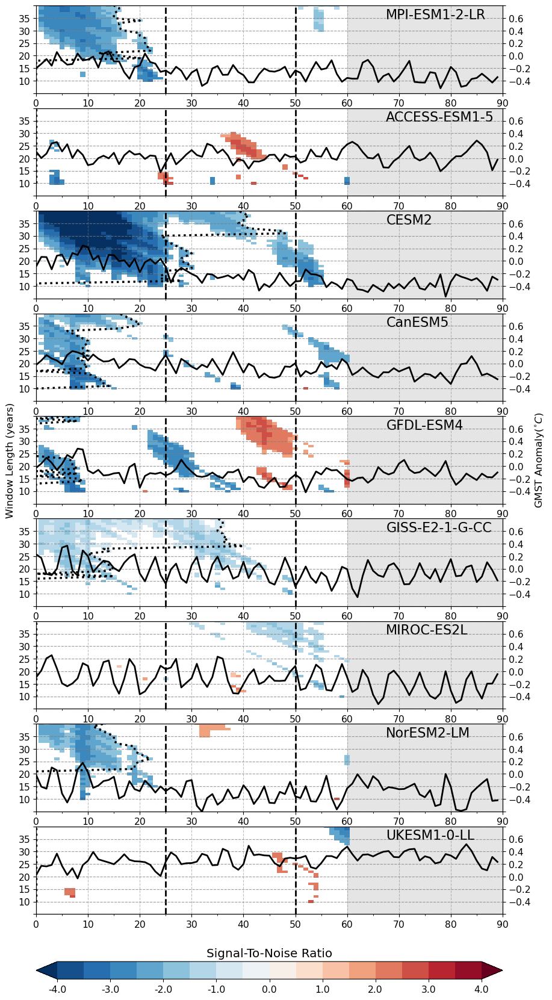

In [227]:
%matplotlib inline
models = unstable_rolling_ds.model.values
font_scale = 0.7

num_plots = len(models)
num_cols = 1
num_rows = int(np.ceil(num_plots/num_cols))

fig = plt.figure(figsize=(10,  21))
gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.2]+[0.2],hspace=0.2, wspace=0)
axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    
    fig, returned_axes = sn_plotting.sn_multi_window_in_time(
        unstable_rolling_ds.sel(model=model).squeeze().signal_to_noise,
        temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
        stable_point_ds = rolling_year_stable_ds.sel(model=model),#rolling_year_stable_ds.sel(model=model),
        fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
        axes_title='', yticks_right = np.arange(-0.6, 1, .2), **stability_colorplot_kwargs_2) 
    ax, ax2, cax = returned_axes
    ax.axvline(unstable_rolling_ds.time.values[24], 0, 1000, color='k', linewidth=2, linestyle='--')
    ax.axvline(unstable_rolling_ds.time.values[49], 0, 1000, color='k', linewidth=2, linestyle='--')
    #ax.set_ylim(9, 40)


    plotting_functions.clip_axis_ends(ax)
    plotting_functions.clip_axis_ends(ax2)

    ax.set_ylabel('')
    if num == 4: ax.set_ylabel('Window Length (years)', size=12)
    if num == 4: ax2.set_ylabel(f'GMST Anomaly({units})', size=12)
    ax.annotate(model, xy=(0.75, 0.85), xycoords='axes fraction', ha='left', size=16)
    if num < 9:
        ax.set_xlabel('')
    


- full garbage collection released 99.71 MiB from 217927 reference cycles (threshold: 9.54 MiB)


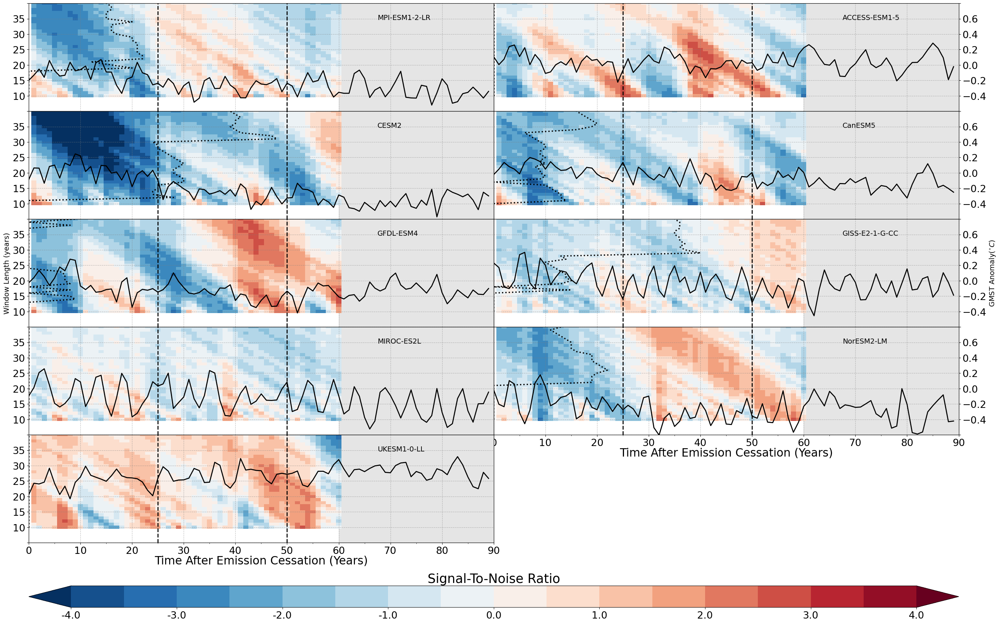

In [228]:
%matplotlib inline
models = unstable_rolling_ds.model.values

num_plots = len(models)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0)
axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    
    fig, returned_axes = sn_plotting.sn_multi_window_in_time(
        sn_multi_rolling_ds.sel(model=model).squeeze().signal_to_noise,
        temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
        stable_point_ds = rolling_year_stable_ds.sel(model=model),#rolling_year_stable_ds.sel(model=model),
        fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
        axes_title='', yticks_right = np.arange(-0.6, 1, .2), **stability_colorplot_kwargs) 
    ax, ax2, cax = returned_axes
    ax.axvline(unstable_rolling_ds.time.values[24], 0, 1000, color='k', linewidth=2, linestyle='--')
    ax.axvline(unstable_rolling_ds.time.values[49], 0, 1000, color='k', linewidth=2, linestyle='--')
    #ax.set_ylim(9, 40)

    if (num+1)%2: # Left plot
        ax2.set_yticks([])
        ax2.set_yticklabels([])
        plotting_functions.clip_axis_ends(ax)
    else: # Right plot
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.set_ylabel(' ')
        plotting_functions.clip_axis_ends(ax2)

    ax.set_ylabel('')
    if num  == 4: ax.set_ylabel('Window Length (years)', size=constants.PlotConfig.title_size*font_scale)
    if num  == 5: ax2.set_ylabel(f'GMST Anomaly({units})', size=constants.PlotConfig.title_size*font_scale)
    ax.annotate(model, xy=(0.75, 0.85), xycoords='axes fraction', ha='left', size=constants.PlotConfig.title_size*font_scale)
    
    if num < 7:
        ax.set_xticklabels([])
        ax.set_xlabel('')

In [229]:
signal_colorplot_kwargs = {'max_color_lim': 60,
 'xlims': (0, 90),
 'patch': True,
 'ax2_ylabel': '',
 'ylabel': '',
 'cmap': 'RdBu_r',
 'bbox_to_anchor': (1, 1.4),
 'labelpad_left': 65,
 'labelpad_right': 15,
 'extend': 'both',
 'cut_ticks': 2,
 'vmax': .4,
 'step': 0.05,
 'font_scale': 1.4,
 # 'cbar_label': 'Signal (K)',
 'hspace': 0.2,
 'return_all': True,
 'rotation': 90}

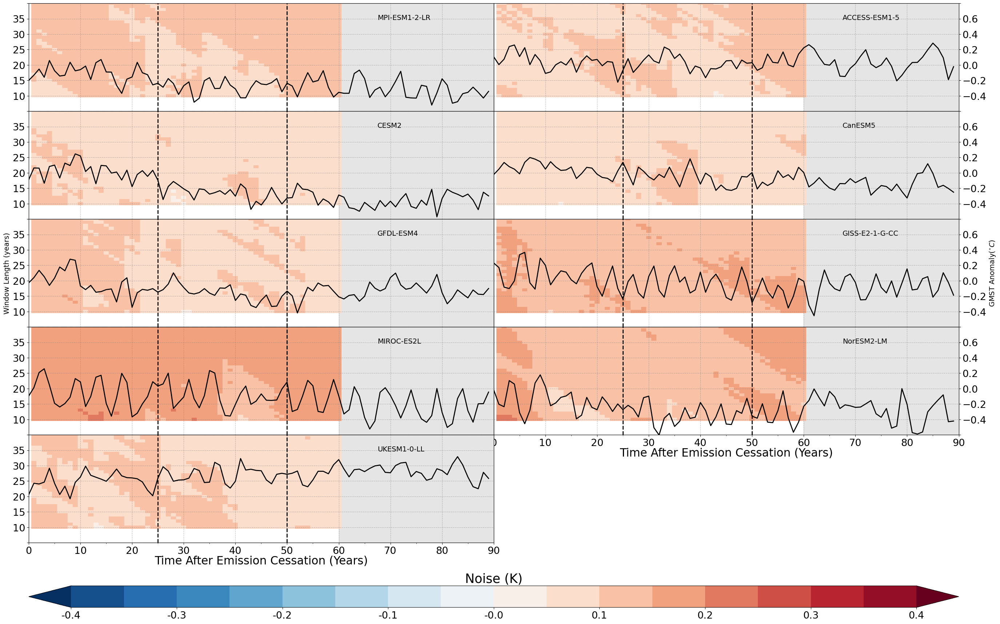

In [230]:
%matplotlib inline
models = unstable_rolling_ds.model.values

num_plots = len(models)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0)
axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    
    fig, returned_axes = sn_plotting.sn_multi_window_in_time(
        sn_multi_rolling_ds.sel(model=model).squeeze().noise,
        temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
        # stable_point_ds = rolling_year_stable_ds.sel(model=model),#rolling_year_stable_ds.sel(model=model),
        fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
        axes_title='', yticks_right = np.arange(-0.6, 1, .2), cbar_label='Noise (K)', **signal_colorplot_kwargs) 
    ax, ax2, cax = returned_axes
    ax.axvline(unstable_rolling_ds.time.values[24], 0, 1000, color='k', linewidth=2, linestyle='--')
    ax.axvline(unstable_rolling_ds.time.values[49], 0, 1000, color='k', linewidth=2, linestyle='--')
    #ax.set_ylim(9, 40)

    if (num+1)%2: # Left plot
        ax2.set_yticks([])
        ax2.set_yticklabels([])
        plotting_functions.clip_axis_ends(ax)
    else: # Right plot
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.set_ylabel(' ')
        plotting_functions.clip_axis_ends(ax2)

    ax.set_ylabel('')
    if num  == 4: ax.set_ylabel('Window Length (years)', size=constants.PlotConfig.title_size*font_scale)
    if num  == 5: ax2.set_ylabel(f'GMST Anomaly({units})', size=constants.PlotConfig.title_size*font_scale)
    ax.annotate(model, xy=(0.75, 0.85), xycoords='axes fraction', ha='left', size=constants.PlotConfig.title_size*font_scale)
    
    if num < 7:
        ax.set_xticklabels([])
        ax.set_xlabel('')

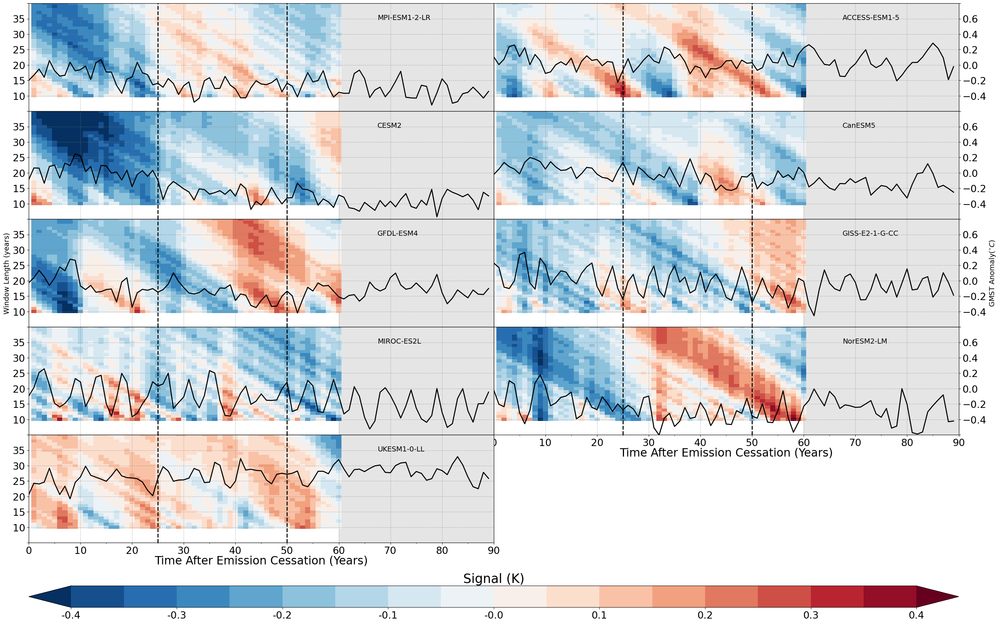

In [231]:
%matplotlib inline
models = unstable_rolling_ds.model.values

num_plots = len(models)
num_cols = 2
num_rows = int(np.ceil(num_plots/num_cols))

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*1.5,  sn_plotting.plot_kwargs['height']*num_plots/5))
gs = gridspec.GridSpec(num_rows+2, num_cols, height_ratios=num_rows*[1] + [0.4]+[0.2],hspace=0, wspace=0)
axes = [fig.add_subplot(gs[i]) for i in range(num_plots)]

for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if  num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num_rows+1, :])
    
    fig, returned_axes = sn_plotting.sn_multi_window_in_time(
        sn_multi_rolling_ds.sel(model=model).squeeze().signal,
        temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
        # stable_point_ds = rolling_year_stable_ds.sel(model=model),#rolling_year_stable_ds.sel(model=model),
        fig=fig, gs=gs, ax=axes[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
        axes_title='', yticks_right = np.arange(-0.6, 1, .2), cbar_label='Signal (K)', **signal_colorplot_kwargs) 
    ax, ax2, cax = returned_axes
    ax.axvline(unstable_rolling_ds.time.values[24], 0, 1000, color='k', linewidth=2, linestyle='--')
    ax.axvline(unstable_rolling_ds.time.values[49], 0, 1000, color='k', linewidth=2, linestyle='--')
    #ax.set_ylim(9, 40)

    if (num+1)%2: # Left plot
        ax2.set_yticks([])
        ax2.set_yticklabels([])
        plotting_functions.clip_axis_ends(ax)
    else: # Right plot
        ax.set_yticks([])
        ax.set_yticklabels([])
        ax.set_ylabel(' ')
        plotting_functions.clip_axis_ends(ax2)

    ax.set_ylabel('')
    if num  == 4: ax.set_ylabel('Window Length (years)', size=constants.PlotConfig.title_size*font_scale)
    if num  == 5: ax2.set_ylabel(f'GMST Anomaly({units})', size=constants.PlotConfig.title_size*font_scale)
    ax.annotate(model, xy=(0.75, 0.85), xycoords='axes fraction', ha='left', size=constants.PlotConfig.title_size*font_scale)
    
    if num < 7:
        ax.set_xticklabels([])
        ax.set_xlabel('')

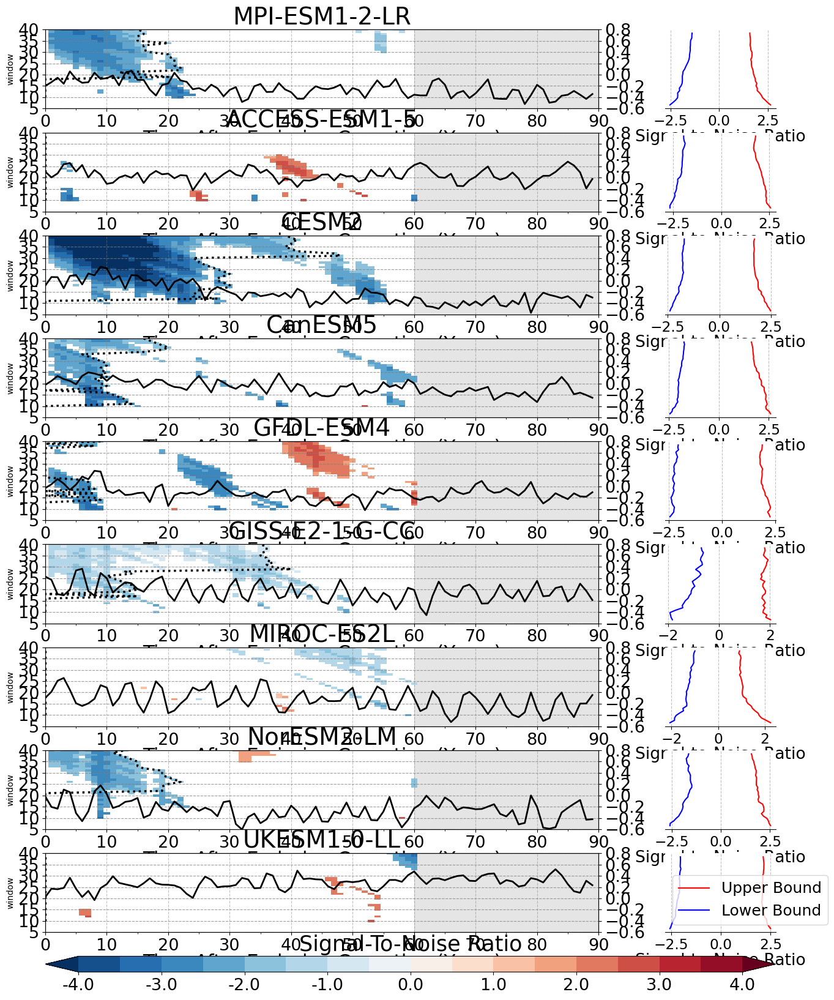

In [232]:
%matplotlib inline
models = unstable_rolling_ds.model.values

num_plots = len(models)

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width']*0.7,  20))
gs = gridspec.GridSpec(num_plots+1, 2, height_ratios=num_plots*[1] + [0.2],
                       width_ratios=[1, 0.2], hspace=sn_plotting.plot_kwargs['hspace']*1.1)

axes_left = [fig.add_subplot(gs[i, 0]) for i in range(num_plots)]
axes_right = [fig.add_subplot(gs[i, 1]) for i in range(num_plots)]
for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num+1, :])
    
    sn_plotting.sn_multi_window_in_time(
        unstable_rolling_ds.sel(model=model).squeeze().signal_to_noise,
        temp_da=a1_smean_anom_ds.squeeze().sel(model=model),
        stable_point_ds = rolling_year_stable_ds.sel(model=model),
        fig=fig, gs=gs, ax=axes_left[num], cax=cax, add_colorbar=add_colorbar, yticks = np.arange(5, 45, 5),
        axes_title=model, yticks_right = np.arange(-0.6, 1, .2), **stability_colorplot_kwargs)  
    
    # Lower and upper bound plots
    sn_multi_rolling_ds.sel(model=model).upper_bound.plot(ax=axes_right[num], y='window', color='red', label='Upper Bound')
    sn_multi_rolling_ds.sel(model=model).lower_bound.plot(ax=axes_right[num], y='window', color='blue',label='Lower Bound')
    plotting_functions.format_axis(axes_right[num], xlabel='Signal-to-Noise Ratio', ylabel='',title='', font_scale=1.2)
    format_null_axis(axes_right[num])
    if num == len(models)-1:axes_right[num].legend(ncol=1, fontsize=18)
# axes = axes_left.extend(axes_right)
# for num, ax in enumerate(axes): plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=1.4)

In [233]:
stability_colorplot_kwargs_no_temp_line = dict(max_color_lim=max_effective_length, xlims=(0, max_effective_length),patch=False,
                                               ax2_ylabel=f'GMST Anomaly({units})', labelpad_left=70)

In [234]:
plot_kwargs = {'exp_type': 'zecmip','levels': np.arange(0, 11, 1), 'tick_offset': 'center',
               'extend': 'neither', 'cbar_label': 'Number of Models not in Equilibrium'}

In [235]:
my_blues = plotting_functions.create_discrete_cmap('BuPu', levels=plot_kwargs['levels'], add_white=True)

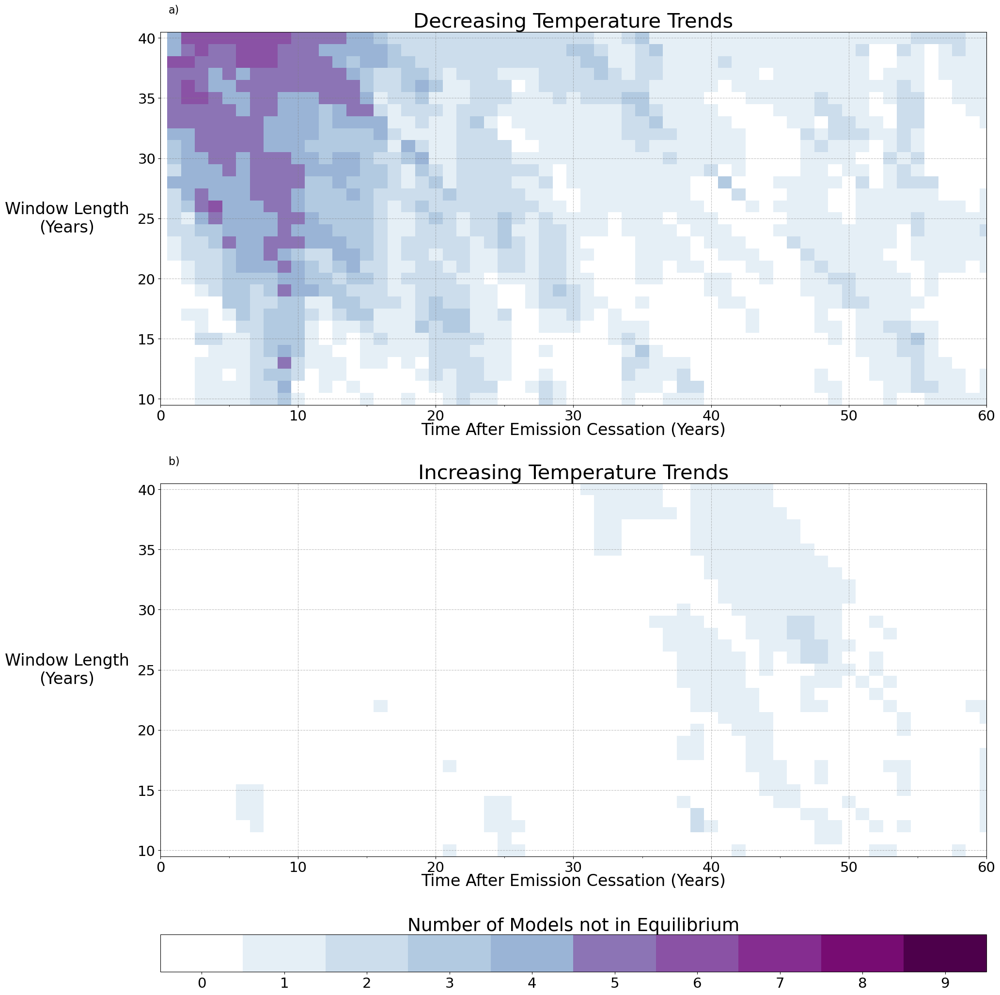

In [236]:
fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'], sn_plotting.plot_kwargs['height']*2.1))

gs = gridspec.GridSpec(3,1, height_ratios=[1, 1, 0.1], hspace=sn_plotting.plot_kwargs['hspace'])
axes = [fig.add_subplot(gs[i]) for i in range(3)]

sn_plotting.sn_multi_window_in_time(
    decreasing_ds.sum(dim='model').signal_to_noise,
    cmap=my_blues,
    fig=fig, gs=gs, ax=axes[0], add_colorbar=False, return_all=False,
    axes_title='Decreasing Temperature Trends', bbox_to_anchor=(1, 1.4),
    **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)

sn_plotting.sn_multi_window_in_time(
    increasing_ds.sum(dim='model').signal_to_noise,
    cmap=my_blues,
    fig=fig, gs=gs, ax=axes[1], cax=axes[2], return_all=False,
    axes_title='Increasing Temperature Trends',
    add_legend=False, **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)

for num, ax_ in enumerate(axes[:2]): plotting_functions.add_figure_label(ax_, f'{chr(97+num)})')

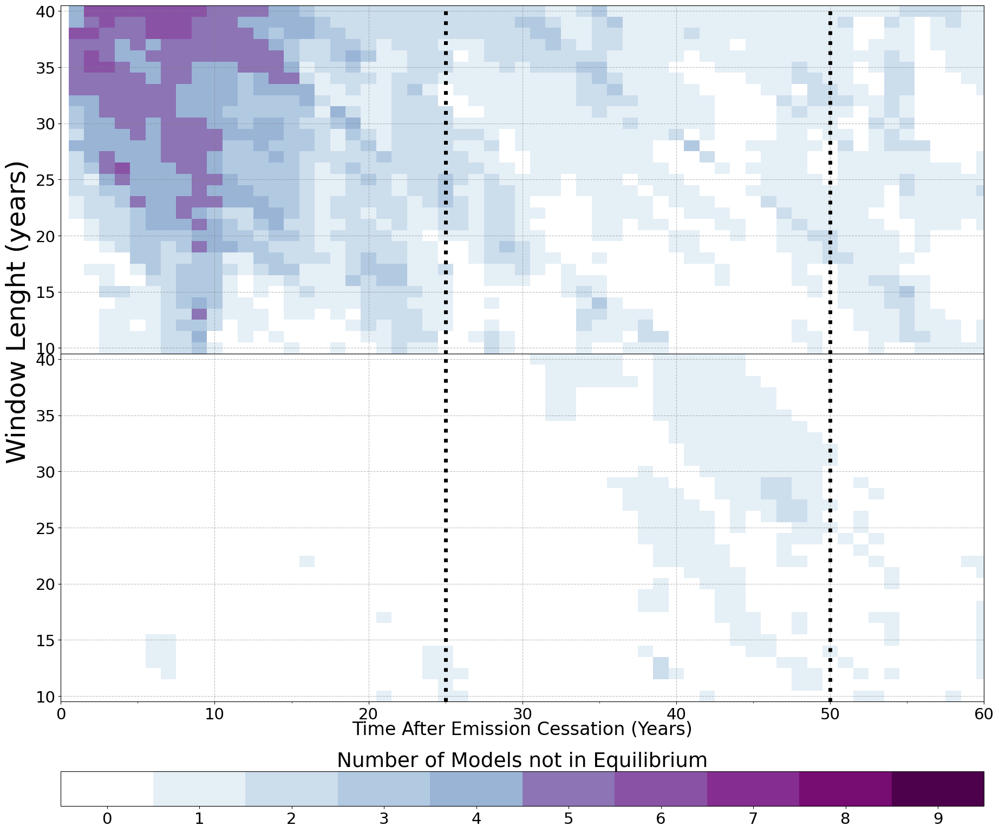

In [237]:
fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'], sn_plotting.plot_kwargs['height']*1.6))

gs = gridspec.GridSpec(4,1, height_ratios=[1, 1, 0.2, 0.1], hspace=0)
axes = [fig.add_subplot(gs[i]) for i in [0, 1, 3]]

sn_plotting.sn_multi_window_in_time(
    decreasing_ds.sum(dim='model').signal_to_noise,
    cmap=my_blues,
    fig=fig, gs=gs, ax=axes[0], add_colorbar=False, return_all=False,
    axes_title='',#'Decreasing Temperature Trends',
    ylabel='',
    bbox_to_anchor=(1, 1.4),
    **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)

sn_plotting.sn_multi_window_in_time(
    increasing_ds.sum(dim='model').signal_to_noise,
    cmap=my_blues,
    fig=fig, gs=gs, ax=axes[1], cax=axes[2], return_all=False,
    axes_title='', ylabel='', #'Increasing Temperature Trends',
    add_legend=False, **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)

for ax in axes[:2]:
    ax.axvline(increasing_ds.time.dt.year.values[24], 0, 1000, color='k', linewidth=5, linestyle=':')
    ax.axvline(increasing_ds.time.dt.year.values[49], 0, 1000, color='k', linewidth=5, linestyle=':')
axes[0].set_ylabel(''); axes[1].set_ylabel('')
axes[1].annotate('Window Lenght (years)', xy=(-.06, 0.7), size=35, xycoords='axes fraction', clip_on=False, rotation=90)
# for num, ax_ in enumerate(axes[:2]): plotting_functions.add_figure_label(ax_, f'{chr(97+num)})')
axes[0].set_xticklabels([]);

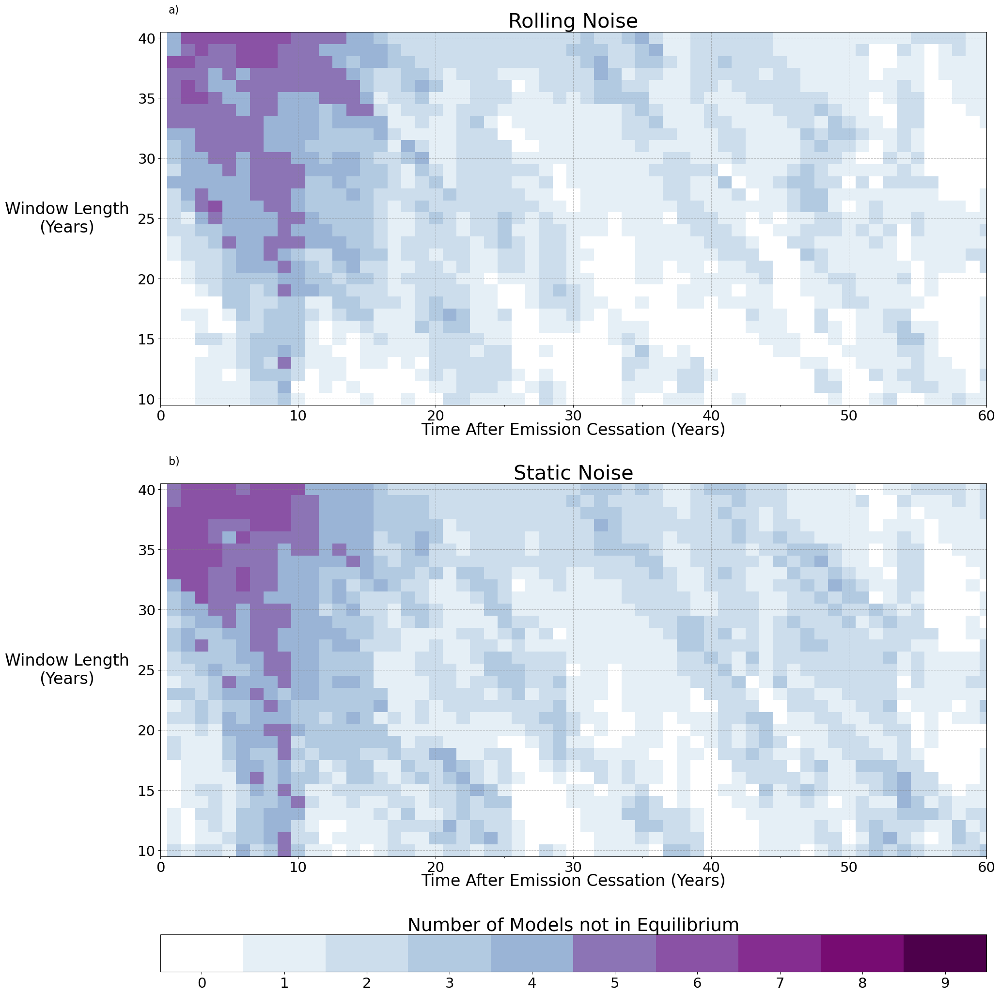

In [238]:
#### Rolling VS Static Noise

%matplotlib inline
fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'], sn_plotting.plot_kwargs['height']*2.1))

gs = gridspec.GridSpec(3,1, height_ratios=[1, 1, 0.1], hspace=sn_plotting.plot_kwargs['hspace'])
axes = [fig.add_subplot(gs[i]) for i in range(3)]

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='increasing').count(dim='model')+\
    rolling_stability_levels_ds.sel(stability='decreasing').count(dim='model'),
    cmap=my_blues,
    fig=fig, gs=gs, ax=axes[0], add_colorbar=False, return_all=False,
    axes_title='Rolling Noise', bbox_to_anchor=(1, 1.4),
    **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)

sn_plotting.sn_multi_window_in_time(
    static_stability_levels_ds.sel(stability='increasing').count(dim='model')+\
    static_stability_levels_ds.sel(stability='decreasing').count(dim='model')
    , cmap=my_blues,
    fig=fig, gs=gs, ax=axes[1], cax=axes[2], return_all=False,
    axes_title='Static Noise',
    add_legend=False, **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)

for num, ax_ in enumerate(axes[:2]): plotting_functions.add_figure_label(ax_, f'{chr(97+num)})')

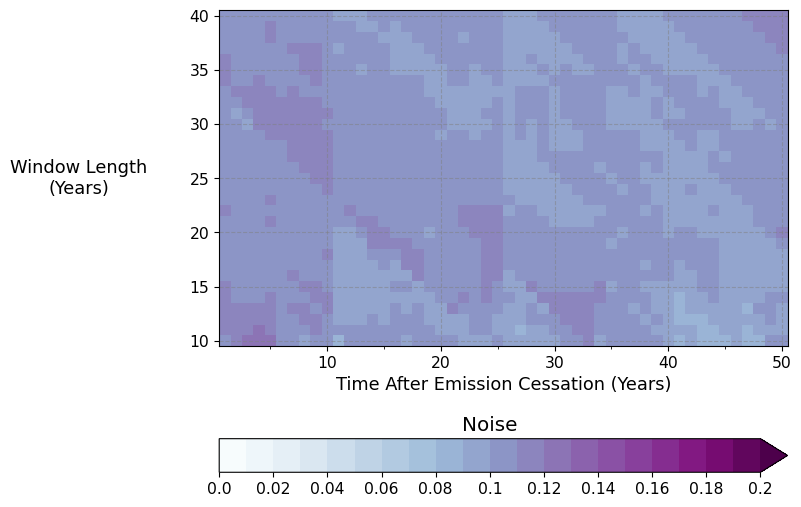

In [239]:
# Noise Median
noise_levels = sn_plotting.create_levels(vmax=.2, vmin=0, step=.01)
sn_plotting.plot_heatmap(sn_multi_rolling_ds.noise.median(dim='model'), levels=noise_levels, 
                                figsize=(sn_plotting.plot_kwargs['width']/3,
                                         sn_plotting.plot_kwargs['height']/2), 
                               cmap='BuPu', extend='max', cut_ticks=2, max_color_lim=50, 
                               font_scale=0.8, cbar_label='Noise', hspace=0.2, return_all=False)

In [240]:
models = a1_smean_anom_ds.model.values

In [241]:
# ncols = 2
# nrows = int(np.ceil(len(models)/ncols))

# fig = plt.figure(figsize=(6*ncols, 2*nrows))
# gs = gridspec.GridSpec(nrows, ncols, hspace=0, wspace=0)
# axes = [fig.add_subplot(gs[i]) for i in range(9)]

# for num, model in enumerate(models):
#     ds = esmpi_smean_ds.sel(model=model).squeeze()
#     mean = ds.mean().values
#     ax = axes[num]
#     ax.plot(ds.time.values, ds.values, label=model)
#     ax.annotate(model, xy=(0.02, 0.05), fontsize=14, xycoords='axes fraction')
#     ax.set_ylim(*(mean* 0.75, mean*1.25))
#     if num == np.ceil(len(models)/2)-1: ax.set_ylabel('GMST Anomaly ' + r'($^\circ$C)', fontsize=14)
#     if num%2: ax.set_yticklabels([])
#     ax.axhline([0], zorder=-10, color='grey', alpha=0.5, linestyle='--')
#     sn_plotting.format_xticks(ax, ds.time.values, ds.time.dt.year.values-1)
#     ax.xaxis.grid(True, alpha=0.5, c='grey', linestyle='--')

# axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25);

In [242]:
esmpi_smean_xrlist

key_dim = model


Number of da/ds: 9
---------------
MPI-ESM1-2-LR ({'model': 1, 'time': 1000})
ACCESS-ESM1-5 ({'model': 1, 'time': 1000})
CESM2         ({'model': 1, 'time': 1200})
CanESM5       ({'model': 1, 'time': 1000})
GFDL-ESM4     ({'model': 1, 'time': 500})
GISS-E2-1-G-CC({'model': 1, 'time': 165})
MIROC-ES2L    ({'model': 1, 'time': 500})
NorESM2-LM    ({'model': 1, 'time': 501})
UKESM1-0-LL   ({'model': 1, 'time': 1880})

In [243]:
yticks = ax.get_yticks()[1:-1]
yticks

array([10., 15., 20., 25., 30., 35., 40.])

In [244]:
# ncols = 2
# nrows = int(np.ceil(len(models)/ncols))

# fig = plt.figure(figsize=(6*ncols, 2*nrows))
# gs = gridspec.GridSpec(nrows, ncols, hspace=0, wspace=0.1)
# axes = [fig.add_subplot(gs[i]) for i in range(9)]

# for num, (model, ds) in enumerate(esmpi_smean_xrlist):
#     ax = axes[num]
#     # ds = utils.reset_time_to_0_start(ds)
#     # ds['time'] = ds.time.dt.year.values
    
#     ax.plot(ds.time.values, ds.squeeze().values) #label='1% CO2')
    
#     ax.annotate(model, xy=(0.02, 0.05), fontsize=14, xycoords='axes fraction')
#     mid_points = np.round(ds.median().values.item(), 0)
#     ax.set_ylim([mid_points-1, mid_points+1])
#     ax.set_yticks(ax.get_yticks()[1:-1])
#     #ax.set_yticks(np.arange(mid_points-0.5, mid_points+.75, 0.25))
#     ax.set_xlim(np.take(ds.time.values, [0, -1]))
#     if num == np.ceil(len(models)/2)-1: ax.set_ylabel('GMST Anomaly ' + r'($^\circ$C)', fontsize=14)
#     # if num%2: ax.set_yticklabels([])
#     sn_plotting.format_xticks(ax, ds.time.values, ds.time.dt.year.values-1)
# #     #ax.axvline(ds.time.values[start_arg], linewidth=1, color='black', label='Abrupt Zero CO2 Emissions Point')
#     ax.grid(True, alpha=0.5, c='grey', linestyle='--')
#     if num not in [7, 8]: ax.set_xticklabels('')

# # leg = axes[0].legend(ncol=4, bbox_to_anchor=[2.1, 1.4], fontsize=12)
# # axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25);

In [245]:
print(pct_smean_xrlist[0])

<xarray.DataArray 'tas' (model: 1, time: 165)> Size: 1kB
13.48 13.52 13.72 13.83 13.68 13.62 13.54 ... 18.66 18.69 18.66 18.8 18.95 18.67
Coordinates:
  * model     (model) <U13 52B 'MPI-ESM1-2-LR'
    ensemble  <U8 32B 'r1i1p1f1'
  * time      (time) object 1kB 1850-12-31 00:00:00 ... 2014-12-31 00:00:00


Text(0.5, 0, 'Time After Emission Cessation (Years)')

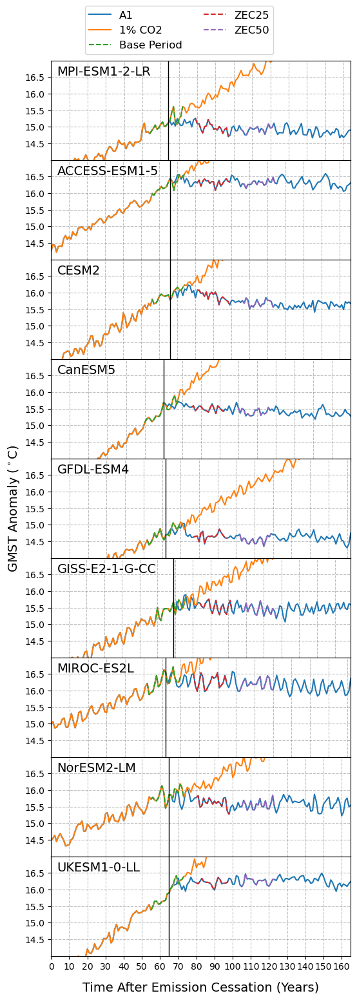

In [246]:
ncols = 1
models = pct_smean_xrlist.refkeys
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0, wspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

for num, (model, ds_orig) in enumerate(pct_smean_xrlist):
    ax = axes[num]
    ds = ds_orig.copy(deep=True)  # Create a deep copy to avoid modifying the original dataset
    ds2 = a1_smean_xrlist[model].copy(deep=True)
    ds  = ds.sel(time=slice(None, ds2.time.values[0]))
    ds2 = ds2.combine_first(ds.isel(time=slice(-2, -1)))
    ds = ds.combine_first(ds2)
    start_arg = np.argwhere(ds.time.values == ds2.time.values[0]).item()
    
    # Ensure that reset_time_to_0_start returns a new dataset
    ds = utils.reset_time_to_0_start(ds.copy(deep=True))
    ds_orig = utils.reset_time_to_0_start(ds_orig.copy(deep=True))  # Create a deep copy to avoid modifying the original dataset
    
    ds['time'] = ds.time.dt.year.values
    ds_orig['time'] = ds_orig.time.dt.year.values
    
    
    ax.plot(ds.time.values, ds.squeeze().values, label='A1')
    ax.plot(ds_orig.time.values, ds_orig.squeeze().values, label='1% CO2')
    
    ds_base = ds_orig.isel(time=slice(start_arg-10, start_arg+9))
    ax.plot(ds_base.time.values, ds_base.squeeze().values, label='Base Period', linestyle='--')

    ds_25 = ds.isel(time=slice(start_arg+25-10, start_arg+25+9))
    ax.plot(ds_25.time.values, ds_25.squeeze().values, label='ZEC25', linestyle='--')
    
    ds_50 = ds.isel(time=slice(start_arg+50-10, start_arg+50+9))
    ax.plot(ds_50.time.values, ds_50.squeeze().values, label='ZEC50', linestyle='--')
    
    
    ax.annotate(model, xy=(0.02, 0.85), fontsize=14, xycoords='axes fraction')
    ax.set_ylim([14, 17])
    ax.set_yticks(np.arange(14.5, 17, 0.5))
    ax.set_xlim(np.take(ds.time.values, [0, -1]))
    if num == np.ceil(len(models)/2)-1: ax.set_ylabel('GMST Anomaly ' + r'($^\circ$C)', fontsize=14)
    #if num%2: ax.set_yticklabels([])
    sn_plotting.format_xticks(ax, ds.time.values, ds.time.values-1)
    ax.axvline(ds.time.values[start_arg], linewidth=1, color='black')#, label='A1')
    ax.grid(True, alpha=0.5, c='grey', linestyle='--')
    if num not in [8]: ax.set_xticklabels('')

leg = axes[0].legend(ncol=2, bbox_to_anchor=[0.76, 1.6], fontsize=12)
axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)

In [247]:
ds_base.mean(dim='time').values.item()

15.893788766013564

Text(0.5, 0, 'Time After Emission Cessation (Years)')

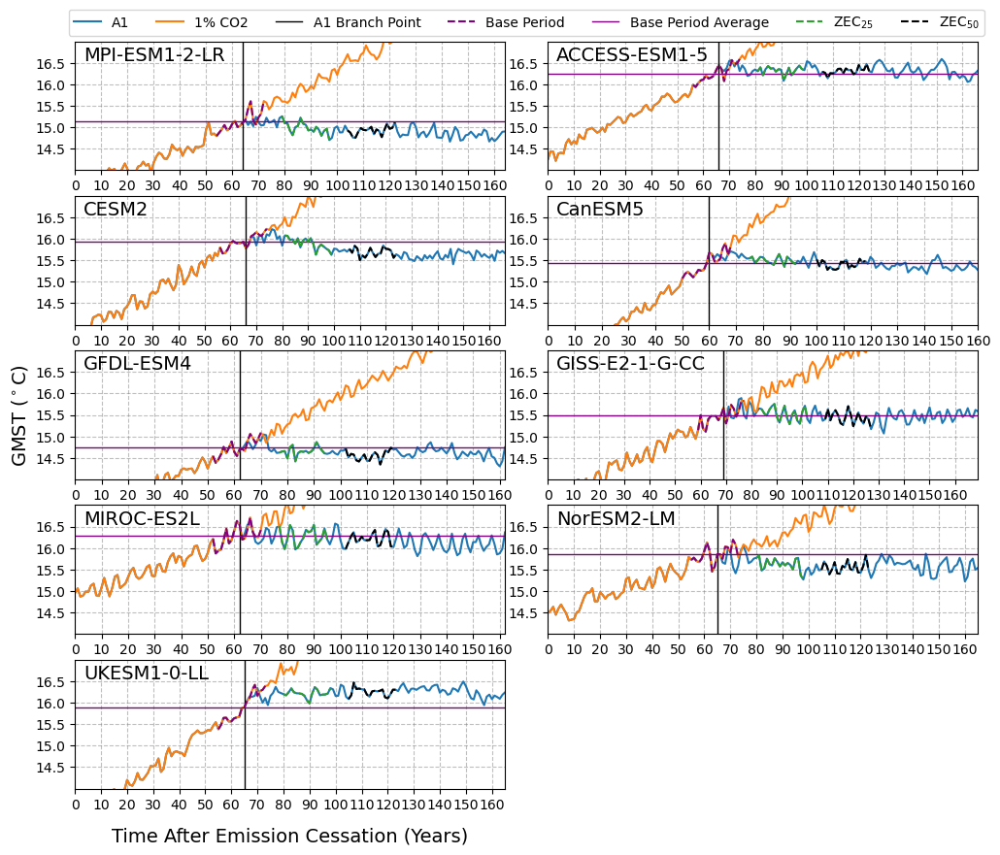

In [248]:
ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.2, wspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

for num, (model, ds_orig) in enumerate(pct_smean_xrlist):
    ax = axes[num]
    ds = ds_orig.copy(deep=True)  # Create a deep copy to avoid modifying the original dataset
    ds2 = a1_smean_xrlist[model].copy(deep=True)
    ds  = ds.sel(time=slice(None, ds2.time.values[0]))
    ds2 = ds2.combine_first(ds.isel(time=slice(-2, -1)))
    ds = ds.combine_first(ds2)
    start_arg = np.argwhere(ds.time.values == ds2.time.values[0]).item()
    
    # Ensure that reset_time_to_0_start returns a new dataset
    ds = utils.reset_time_to_0_start(ds.copy(deep=True))
    ds_orig = utils.reset_time_to_0_start(ds_orig.copy(deep=True))  # Create a deep copy to avoid modifying the original dataset
    
    ds['time'] = ds.time.dt.year.values
    ds_orig['time'] = ds_orig.time.dt.year.values
    
    ds_base = ds_orig.isel(time=slice(start_arg-10, start_arg+9))

    # A1
    ax.plot(ds.time.values, ds.squeeze().values, label='A1')
    # 1% CO2
    ax.plot(ds_orig.time.values, ds_orig.squeeze().values, label='1% CO2')

    # Vertical Line marking start of A1
    ax.axvline(ds.time.values[start_arg], linewidth=1, color='black', label='A1 Branch Point')

    # Base period dashed line
    ax.plot(ds_base.time.values, ds_base.squeeze().values, label='Base Period', linestyle='--', color='purple')
    
    # Line for the average of the base period
    ax.axhline(ds_base.mean(dim='time').values.item(), linewidth=1, color='purple', label='Base Period Average')
    
    #Dashed lines for ZEC25 and ZEC50
    ds_25 = ds.isel(time=slice(start_arg+25-10, start_arg+25+9))
    ax.plot(ds_25.time.values, ds_25.squeeze().values, label='ZEC'+r'$_{25}$', linestyle='--')
    ds_50 = ds.isel(time=slice(start_arg+50-10, start_arg+50+9))
    # ax.plot(ds_50.time.values, np.tile(ds_50.mean().values, len(ds_50.time.values)), color='black')
    ax.plot(ds_50.time.values, ds_50.squeeze().values, label='ZEC'+r'$_{50}$', linestyle='--', color='black')

    ax.annotate(model, xy=(0.02, 0.85), fontsize=14, xycoords='axes fraction')
    ax.set_ylim([14, 17])
    ax.set_yticks(np.arange(14.5, 17, 0.5))
    ax.set_xlim(np.take(ds.time.values, [0, -1]))
    if num == np.ceil(len(models)/2)-1: ax.set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)
    sn_plotting.format_xticks(ax, ds.time.values, ds.time.values-1)

    ax.grid(True, alpha=0.5, c='grey', linestyle='--')
    #if num not in [7, 8]: ax.set_xticklabels('')

# Place the legend at the center just above the first row of plots
# Adjust the bbox_to_anchor values to center the legend
leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)

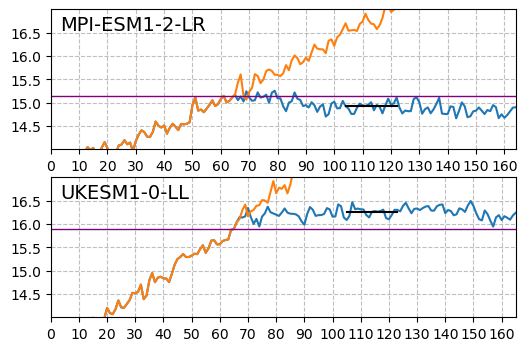

In [249]:
model_subset = ['MPI-ESM1-2-LR', 'UKESM1-0-LL']
ncols = 1
nrows = len(model_subset)

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.2)
axes = [fig.add_subplot(gs[i]) for i in range(len(model_subset))]

for num, model in enumerate(model_subset):
    ds_orig = pct_smean_xrlist[model]
    ax = axes[num]
    ds = ds_orig.copy(deep=True)  # Create a deep copy to avoid modifying the original dataset
    ds2 = a1_smean_xrlist[model].copy(deep=True)
    ds  = ds.sel(time=slice(None, ds2.time.values[0]))
    ds2 = ds2.combine_first(ds.isel(time=slice(-2, -1)))
    ds = ds.combine_first(ds2)
    start_arg = np.argwhere(ds.time.values == ds2.time.values[0]).item()
    
    # Ensure that reset_time_to_0_start returns a new dataset
    ds = utils.reset_time_to_0_start(ds.copy(deep=True))
    ds_orig = utils.reset_time_to_0_start(ds_orig.copy(deep=True))  # Create a deep copy to avoid modifying the original dataset
    
    ds['time'] = ds.time.dt.year.values
    ds_orig['time'] = ds_orig.time.dt.year.values
    
    ds_base = ds_orig.isel(time=slice(start_arg-10, start_arg+9))

    # A1
    ax.plot(ds.time.values, ds.squeeze().values, label='A1')
    # 1% CO2
    ax.plot(ds_orig.time.values, ds_orig.squeeze().values, label='1% CO2')

    # Vertical Line marking start of A1
    # ax.axvline(ds.time.values[start_arg], linewidth=1, color='black', label='A1 Branch Point')

    # Base period dashed line
    # ax.plot(ds_base.time.values, ds_base.squeeze().values, label='Base Period', linestyle='--', color='purple')
    
    # Line for the average of the base period
    ax.axhline(ds_base.mean(dim='time').values.item(), linewidth=1, color='purple', label='Base Period Average')
    
    #Dashed lines for ZEC25 and ZEC50
    ds_25 = ds.isel(time=slice(start_arg+25-10, start_arg+25+9))
    # ax.plot(ds_25.time.values, ds_25.squeeze().values, label='ZEC'+r'$_{25}$', linestyle='--')
    ds_50 = ds.isel(time=slice(start_arg+50-10, start_arg+50+9))
    ax.plot(ds_50.time.values, np.tile(ds_50.mean().values, len(ds_50.time.values)), color='black')
    # ax.plot(ds_50.time.values, ds_50.squeeze().values, label='ZEC'+r'$_{50}$', linestyle='--', color='black')

    ax.annotate(model, xy=(0.02, 0.85), fontsize=14, xycoords='axes fraction')
    ax.set_ylim([14, 17])
    ax.set_yticks(np.arange(14.5, 17, 0.5))
    ax.set_xlim(np.take(ds.time.values, [0, -1]))
    if num == np.ceil(len(models)/2)-1: ax.set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)
    sn_plotting.format_xticks(ax, ds.time.values, ds.time.values-1)

    ax.grid(True, alpha=0.5, c='grey', linestyle='--')
    #if num not in [7, 8]: ax.set_xticklabels('')

# Place the legend at the center just above the first row of plots
# # Adjust the bbox_to_anchor values to center the legend
# leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
# axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)

Text(0.5, 0, 'Time After Emission Cessation (Years)')

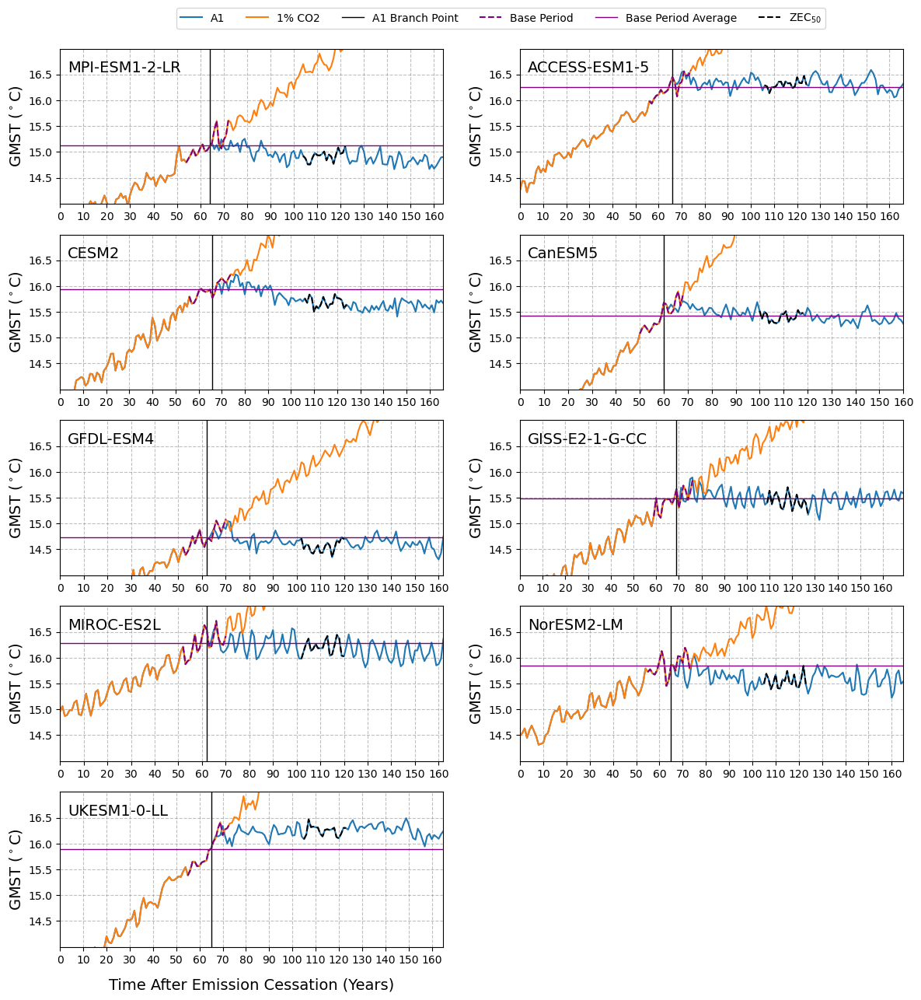

In [250]:
ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(7*ncols, 3*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.2, wspace=.2)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

for num, (model, ds_orig) in enumerate(pct_smean_xrlist):
    ax = axes[num]
    ds = ds_orig.copy(deep=True)  # Create a deep copy to avoid modifying the original dataset
    ds2 = a1_smean_xrlist[model].copy(deep=True)
    ds  = ds.sel(time=slice(None, ds2.time.values[0]))
    ds2 = ds2.combine_first(ds.isel(time=slice(-2, -1)))
    ds = ds.combine_first(ds2)
    start_arg = np.argwhere(ds.time.values == ds2.time.values[0]).item()
    
    # Ensure that reset_time_to_0_start returns a new dataset
    ds = utils.reset_time_to_0_start(ds.copy(deep=True))
    ds_orig = utils.reset_time_to_0_start(ds_orig.copy(deep=True))  # Create a deep copy to avoid modifying the original dataset
    
    ds['time'] = ds.time.dt.year.values
    ds_orig['time'] = ds_orig.time.dt.year.values
    
    ds_base = ds_orig.isel(time=slice(start_arg-10, start_arg+9))

    # A1
    ax.plot(ds.time.values, ds.squeeze().values, label='A1')
    # 1% CO2
    ax.plot(ds_orig.time.values, ds_orig.squeeze().values, label='1% CO2')

    # Vertical Line marking start of A1
    ax.axvline(ds.time.values[start_arg], linewidth=1, color='black', label='A1 Branch Point')

    # Base period dashed line
    ax.plot(ds_base.time.values, ds_base.squeeze().values, label='Base Period', linestyle='--', color='purple')
    
    # Line for the average of the base period
    ax.axhline(ds_base.mean(dim='time').values.item(), linewidth=1, color='purple', label='Base Period Average')
    
    #Dashed lines for ZEC25 and ZEC50
    # ds_25 = ds.isel(time=slice(start_arg+25-10, start_arg+25+9))
    # ax.plot(ds_25.time.values, ds_25.squeeze().values, label='ZEC'+r'$_{25}$', linestyle='--')
    ds_50 = ds.isel(time=slice(start_arg+50-10, start_arg+50+9))
    ax.plot(ds_50.time.values, ds_50.squeeze().values, label='ZEC'+r'$_{50}$', linestyle='--', color='black')

    ax.annotate(model, xy=(0.02, 0.85), fontsize=14, xycoords='axes fraction')
    ax.set_ylim([14, 17])
    ax.set_yticks(np.arange(14.5, 17, 0.5))
    ax.set_xlim(np.take(ds.time.values, [0, -1]))
    ax.set_ylabel('GMST ' + r'($^\circ$C)', fontsize=14)
    sn_plotting.format_xticks(ax, ds.time.values, ds.time.values-1)

    ax.grid(True, alpha=0.5, c='grey', linestyle='--')
    #if num not in [7, 8]: ax.set_xticklabels('')

# Place the legend at the center just above the first row of plots
# Adjust the bbox_to_anchor values to center the legend
leg = axes[1].legend(ncol=7, bbox_to_anchor=[-0.05, 1.3], loc='upper center', fontsize=10)
axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25)

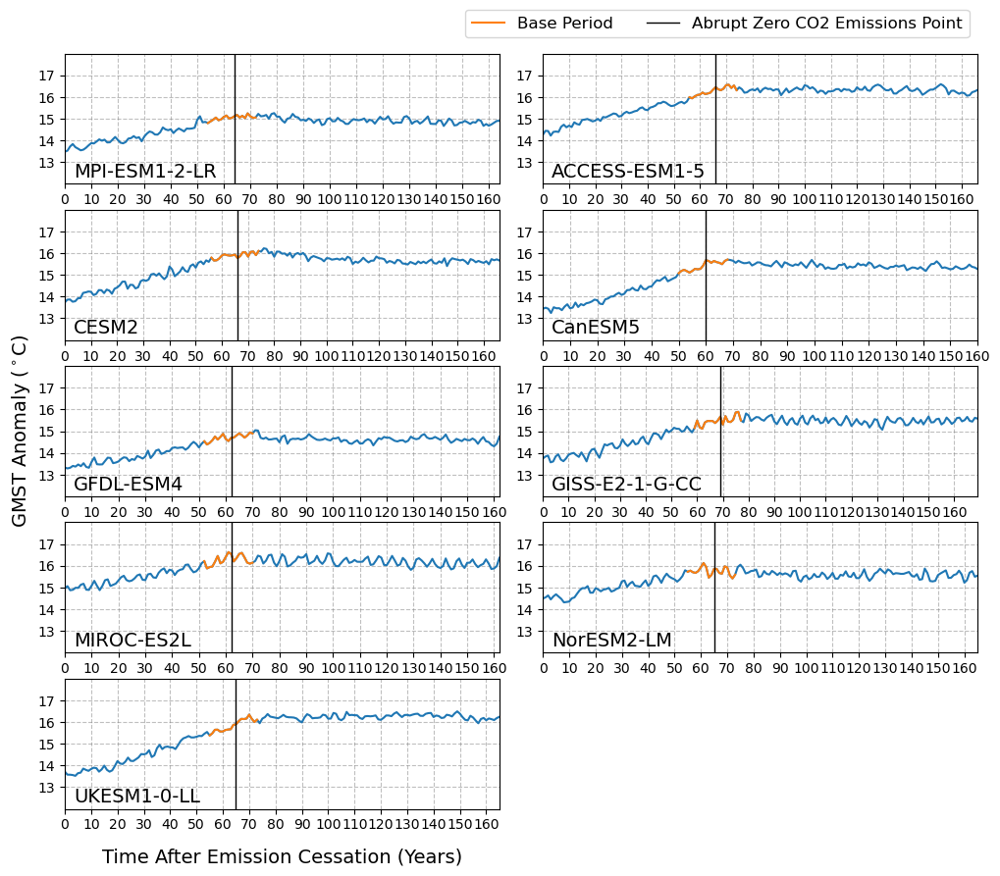

In [251]:
ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0.2, wspace=0.1)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

for num, (model, ds) in enumerate(pct_smean_xrlist):
    ax = axes[num]
    ds2 = a1_smean_xrlist[model]
    # ax.plot(ds.time.values, ds.squeeze().values)
    ds  = ds.sel(time=slice(None, ds2.time.values[0]))
    ds2 = ds2.combine_first(ds.isel(time=slice(-2, -1)))
    ds = ds.combine_first(ds2)
    start_arg = np.argwhere(ds.time.values == ds2.time.values[0]).item()
    ds = utils.reset_time_to_0_start(ds)
    ds['time'] = ds.time.dt.year.values
    
    ax.plot(ds.time.values, ds.squeeze().values) #label='1% CO2')
    ds_base = ds.isel(time=slice(start_arg-10, start_arg+9))
    ax.plot(ds_base.time.values, ds_base.squeeze().values, label='Base Period')

    # ds_25 = ds.isel(time=slice(start_arg+25-10, start_arg+25+9))
    # ax.plot(ds_25.time.values, ds_25.squeeze().values, label='ZEC25 Period')
    
    
    # ds_50 = ds.isel(time=slice(start_arg+50-10, start_arg+50+9))
    # ax.plot(ds_50.time.values, ds_50.squeeze().values, label='ZEC50 Period')
    
    ax.annotate(model, xy=(0.02, 0.05), fontsize=14, xycoords='axes fraction')
    ax.set_ylim([12, 18])
    ax.set_yticks(np.arange(13, 18, 1))
    ax.set_xlim(np.take(ds.time.values, [0, -1]))
    if num == np.ceil(len(models)/2)-1: ax.set_ylabel('GMST Anomaly ' + r'($^\circ$C)', fontsize=14)
    #if num%2: ax.set_yticklabels([])
    sn_plotting.format_xticks(ax, ds.time.values, ds.time.values-1)
    ax.axvline(ds.time.values[start_arg], linewidth=1, color='black', label='Abrupt Zero CO2 Emissions Point')
    ax.grid(True, alpha=0.5, c='grey', linestyle='--')
    #if num not in [7, 8]: ax.set_xticklabels('')

leg = axes[0].legend(ncol=4, bbox_to_anchor=[2.1, 1.4], fontsize=12)
axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25);

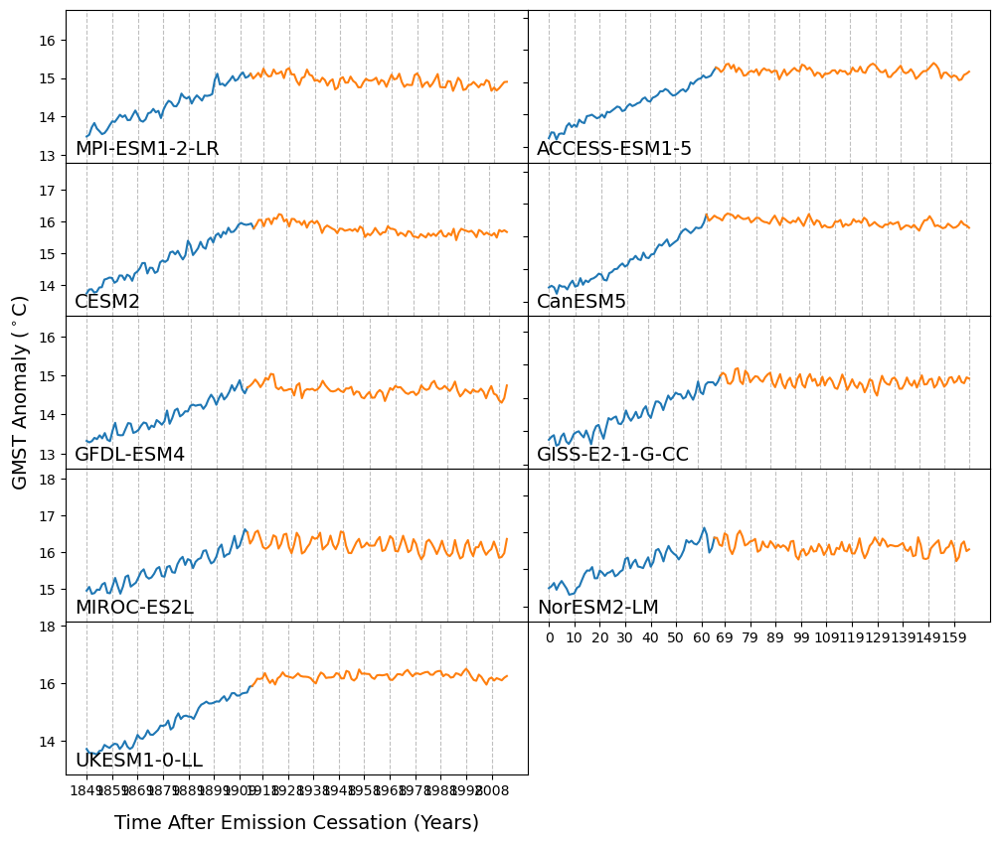

In [252]:
ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0, wspace=0)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

for num, (model, ds) in enumerate(pct_smean_xrlist):
    ds2 = a1_smean_xrlist[model]
    ax = axes[num]
    ds  = ds.sel(time=slice(None, ds2.time.values[0]))
    ds2 = ds2.combine_first(ds.isel(time=slice(-2, -1)))
    ds = ds.isel(time=slice(None, -1))
    ax.plot(ds.time.values, ds.squeeze().values, label='1% CO2')
    ax.plot(ds2.time.values, ds2.squeeze().values, label='A1')
    ax.annotate(model, xy=(0.02, 0.05), fontsize=14, xycoords='axes fraction')
    llim = 0.95 * np.min([ds.min().values, ds2.min().values])
    ulim = 1.1 * np.max([ds.max().values, ds2.max().values])
    # llim=12; ulim=18
    ax.set_ylim([llim, ulim])
    if num == np.ceil(len(models)/2)-1: ax.set_ylabel('GMST Anomaly ' + r'($^\circ$C)', fontsize=14)
    if num%2: ax.set_yticklabels([])
    ax.axhline([0], zorder=-10, color='grey', alpha=0.5, linestyle='--')
    sn_plotting.format_xticks(ax, np.concatenate([ds.time.values, ds2.time.values]), 
                              np.concatenate([ds.time.dt.year.values, ds2.time.dt.year.values])-1)
    ax.xaxis.grid(True, alpha=0.5, c='grey', linestyle='--')
    ax.axvline(ds2.time.values[0], llim, ulim, color='red')


axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25);

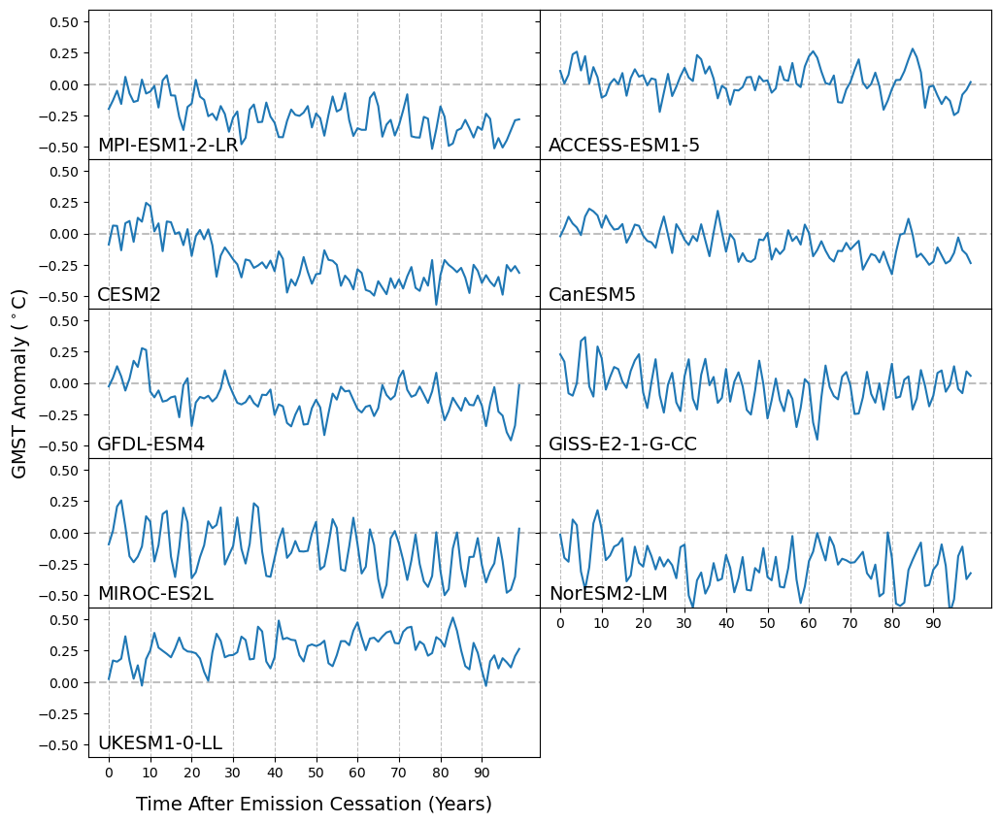

In [253]:
ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(6*ncols, 2*nrows))
gs = gridspec.GridSpec(nrows, ncols, hspace=0, wspace=0)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

for num, model in enumerate(models):
    ds = a1_smean_anom_ds.sel(model=model).squeeze()
    ax = axes[num]
    ax.plot(ds.time.values, ds.values, label=model)
    ax.annotate(model, xy=(0.02, 0.05), fontsize=14, xycoords='axes fraction')
    ax.set_ylim([-0.6, 0.6])
    if num == np.ceil(len(models)/2)-1: ax.set_ylabel('GMST Anomaly ' + r'($^\circ$C)', fontsize=14)
    if num%2: ax.set_yticklabels([])
    ax.axhline([0], zorder=-10, color='grey', alpha=0.5, linestyle='--')
    sn_plotting.format_xticks(ax, ds.time.values, ds.time.dt.year.values-1)
    ax.xaxis.grid(True, alpha=0.5, c='grey', linestyle='--')

axes[-1].set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25);

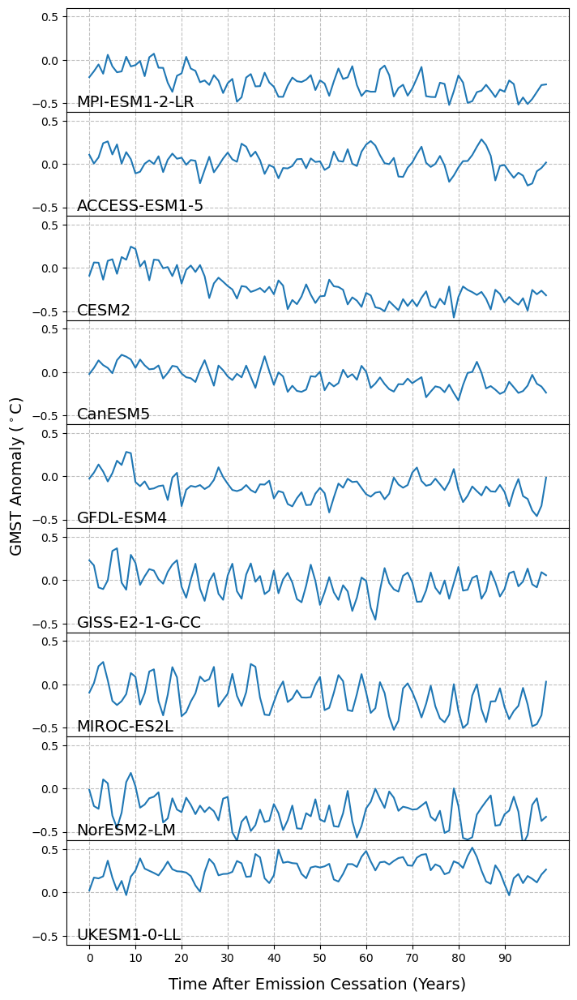

In [254]:
fig = plt.figure(figsize=(8, 15))
gs = gridspec.GridSpec(9, 1, hspace=0)
axes = [fig.add_subplot(gs[i]) for i in range(9)]

for num, model in enumerate(a1_smean_anom_ds.model.values):
    ds = a1_smean_anom_ds.sel(model=model).squeeze()
    ax = axes[num]
    ax.plot(ds.time.values, ds.values, label=model)
    ax.annotate(model, xy=(0.02, 0.05), fontsize=14, xycoords='axes fraction')
    ax.set_ylim([-0.6, 0.6])
    if num == np.ceil(len(models)/2)-1: ax.set_ylabel('GMST Anomaly ' + r'($^\circ$C)', fontsize=14)
    sn_plotting.format_xticks(ax, ds.time.values, ds.time.dt.year.values-1)
    #ax.axhline([0], zorder=-10, color='grey', alpha=0.3, linestyle='--')
    ax.grid(True, alpha=0.5, c='grey', linestyle='--')

ax.set_xlabel('Time After Emission Cessation (Years)', va='bottom', fontsize=14, labelpad=25);

In [255]:
import pymannkendall

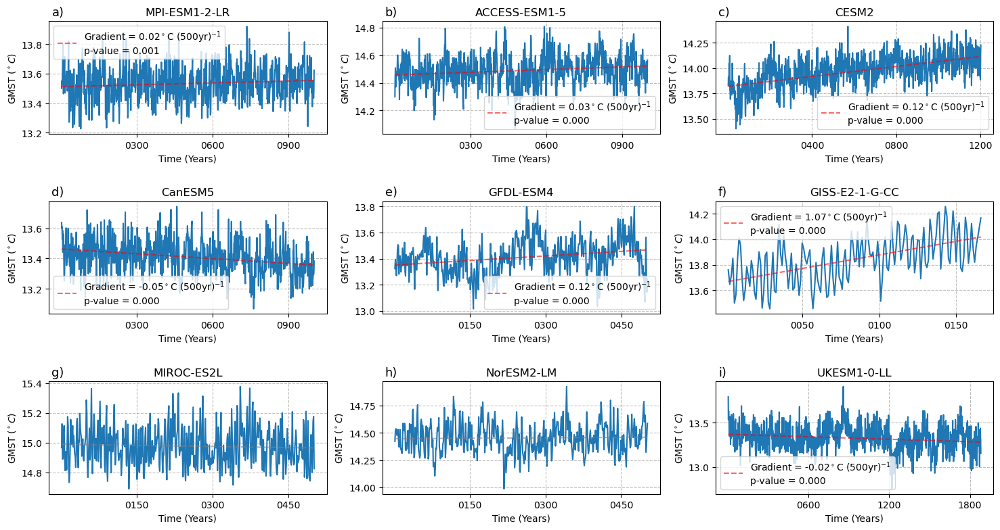

In [256]:
models = esmpi_smean_xrlist.refkeys
ncols = 3; nrows = int(np.ceil(len(models)/2))

fig = plt.figure(figsize=(18, 16))
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, hspace=0.6)

for num, (model, ds) in enumerate(esmpi_smean_xrlist):
    ax = fig.add_subplot(gs[num])
    time = utils.convert_to_0_start_cftime(ds.time.values)
    ax.plot(time,ds.squeeze())
    
    plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=0.8)
    ax.set_title(model); ax.set_ylabel(r'GMST $(^\circ C)$'); ax.set_xlabel('Time (Years)')
    # ax.set_xlim([time[0], time[-1]])
    
    init_y = ds.squeeze().values
    x = np.arange(len(init_y))
    grad_yint = np.polyfit(x, init_y, deg=1)

    fitted_line = np.polyval(grad_yint, x)
    mk_val = pymannkendall.original_test(init_y)
    mk_pval = mk_val.p
    if mk_pval < 0.05:
        color = 'red'
        label = f'Gradient = {grad_yint[0]*500:.2f}' + r'$^\circ$C (500yr)$^{-1}$' + f'\np-value = {mk_pval:.3f}'
    else:
        color='grey'
        label=None
    
    ax.plot(time, fitted_line, linestyle='--', alpha=0.6, color=color, label=label)
    ax.grid(True, alpha=0.5, c='grey', linestyle='--')
    if mk_pval < 0.05: ax.legend(ncol=1, loc='best')#bbox_to_anchor=(0.6, 1.06))